## This Notebook is tasked with learning the kernel from some pinhole data. 
#### We do it in two stages. First we apply an affine transform model to get the kernel in the right location. Then we make regions of the kernel trainable and do further training. 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import os, sys
main_dir = os.path.dirname(os.path.dirname(os.path.abspath('')))
sys.path.insert(0, main_dir)

import models.helper as hlp
from models.custom.model import *
import forward.fourier.method as fwd

from forward.fourier.kernel_creator import *
import scipy.ndimage
from skimage.transform import rotate

import gc
def clear_gpu():
    gc.collect()
    torch.cuda.empty_cache()


if torch.cuda.is_available():
    print(torch.cuda.device_count(), "GPU(s) available:")
    for i in range(torch.cuda.device_count()):
        print(torch.cuda.get_device_name(i))
else:
    print("No GPUs available.")


%load_ext autoreload
%autoreload 2
device = 'cuda:0'

desired_range = [750,850]
desired_channels = 25

from scipy.ndimage import center_of_mass

/home/s/Sunny.Howard/anaconda3/envs/torchenv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


4 GPU(s) available:
NVIDIA A40
NVIDIA A40
NVIDIA A40
NVIDIA A40


## Go from nograting cube to grating cube with grad descent


In [2]:
def WienerDeconvolution(final, kernel, lamb = 0.001):
    
    nc = kernel.shape[-1]
    padder = [[0,0]]*(len(kernel.shape) -1) + [[nc//2,nc//2]]
    
    # kernel = np.fft.fftshift(kernel)

    
    kernelpad = np.pad(kernel,padder)
    finalpad = np.pad(final,padder)
    
    kernel_fft = np.fft.fft(kernelpad,axis=-1)
    final_fft = np.fft.fft(finalpad,axis=-1)

    original_fft=(np.conj(kernel_fft)*final_fft)/ (np.square(np.abs(kernel_fft))+ lamb)


    original = np.abs(np.fft.ifftshift(np.fft.ifft(original_fft,axis=-1),axes=-1))

    original = original[...,nc//2:-(nc//2)]

    return original

dir = '/project/agdoepp/Experiment/Hyperspectral_Calibration_FTS/20231016_Monochromator/'


In [3]:

grating_cube = torch.load(dir + 'pinhole_cube_grating.pt').to(torch.float32).to(device)

nograting_cube = torch.load(dir + 'pinhole_cube_nograting.pt').to(torch.float32).to(device)



norm = nograting_cube.max()

grating_cube = grating_cube / norm
nograting_cube = nograting_cube / norm

# lines_grating_cube = torch.load(dir + 'lines_cube_grating.pt').to(torch.float32).to(device)
# lines_nograting_cube = torch.load(dir + 'lines_cube_nograting.pt').to(torch.float32).to(device)

# norm = lines_nograting_cube.max()
# lines_grating_cube = lines_grating_cube / norm
# lines_nograting_cube = lines_nograting_cube / norm


mask_grating_cube = torch.load(dir + 'mask_cube_grating.pt').to(torch.float32).to(device)
mask_nograting_cube_orig = torch.load(dir + 'mask_cube_nograting.pt').to(torch.float32).to(device)
mask_nograting_cube = torch.load(dir + 'groundtruth.pt').to(torch.float32).to(device)

norm = mask_nograting_cube.max()
mask_grating_cube = mask_grating_cube / norm
mask_nograting_cube = mask_nograting_cube / norm

# ratio = grating_cube.mean() / nograting_cube.mean()


#i initialize kernel with the wiener deconvolution.
simnograting_cube = torch.zeros_like(nograting_cube)
maxloc = torch.where(nograting_cube==nograting_cube.max())
simnograting_cube[:,:,maxloc[2],maxloc[3]] = 1
# print(ratio)
weiner_kernel = disperser.undisperse_all_orders(grating_cube, simnograting_cube, wiener=True, lamb=0.0001).to(device).to(torch.float32)

weiner_kernel[weiner_kernel<weiner_kernel.max()*0.001] = 0
kernel = torch.zeros_like(weiner_kernel)

nc,nx,ny = torch.where(weiner_kernel[0]>0)

for c in torch.unique(nc):
    for y in torch.unique(ny[nc==c]):
        x_new = np.round(center_of_mass(weiner_kernel[0,c,:,y].cpu().numpy())).astype(int)[0]

        kernel[:,c,x_new,y] = torch.sum(weiner_kernel[:,c,:,y])





In [4]:
mask_nograting_cube.mean(),mask_grating_cube.mean()

(tensor(0.0018, device='cuda:0'), tensor(0.0019, device='cuda:0'))

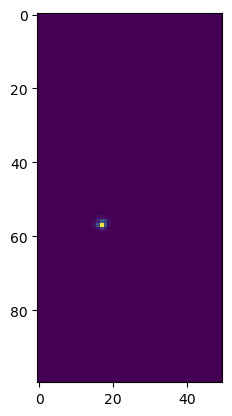

In [5]:
plt.imshow(grating_cube[0,:,400:500,1200:1250].sum(0).cpu().numpy())

In [6]:
from scipy.ndimage import center_of_mass

In [7]:
coms = np.zeros((25,2))

for i in range(25):
    coms[i] = center_of_mass(grating_cube[0,i,400:500,1200:1250].cpu().numpy())

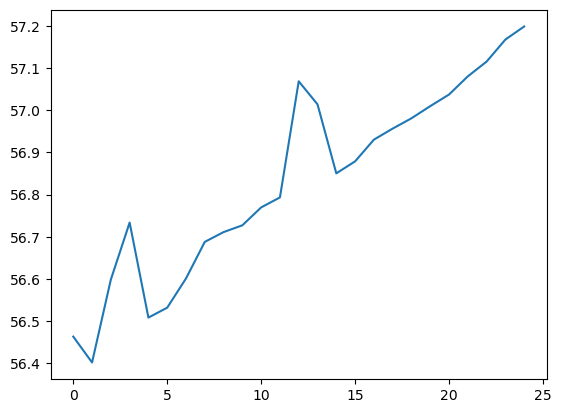

In [8]:
plt.plot(coms[:,0])

In [9]:
kernel.mean(), weiner_kernel.mean()

(tensor(9.7070e-07, device='cuda:0'), tensor(9.7070e-07, device='cuda:0'))

In [10]:
mask_nograting_cube_orig = mask_nograting_cube_orig / norm

mask_nograting_cube_orig.mean(), mask_nograting_cube.mean(), mask_nograting_cube.max(), mask_nograting_cube_orig.max()

(tensor(0.0019, device='cuda:0'),
 tensor(0.0018, device='cuda:0'),
 tensor(1., device='cuda:0'),
 tensor(1.0636, device='cuda:0'))

In [11]:
torch.mean(mask_nograting_cube_orig - mask_nograting_cube)

tensor(5.0694e-05, device='cuda:0')

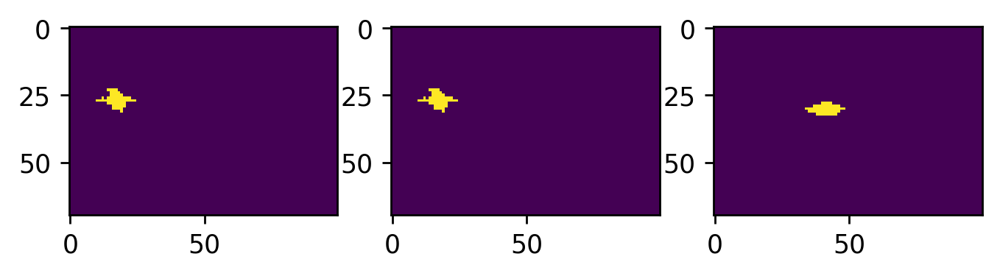

In [12]:
fig,ax = plt.subplots(1,3,dpi=250)
ax[0].imshow(nograting_cube[0,11,430:500,1200:1300].cpu().numpy(),vmax=0.0001)
ax[1].imshow(grating_cube[0,11,430:500,1200:1300].cpu().numpy(),vmax=0.0001)
ax[2].imshow(grating_cube[0,11,430:500,2100:2200].cpu().numpy(),vmax=0.0001)

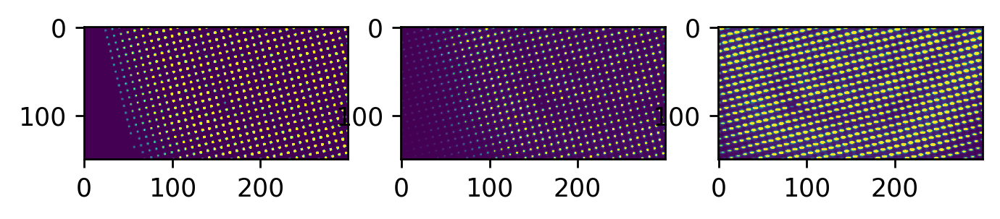

In [13]:
fig,ax = plt.subplots(1,3,dpi=250)
ax[0].imshow(mask_nograting_cube[0,11,350:500,1000:1300].cpu().numpy(),vmax=.1)
ax[1].imshow(mask_grating_cube[0,11,350:500,1000:1300].cpu().numpy(),vmax=0.1)
ax[2].imshow(mask_grating_cube[0,11,350:500,2000:2300].cpu().numpy(),vmax=0.01)

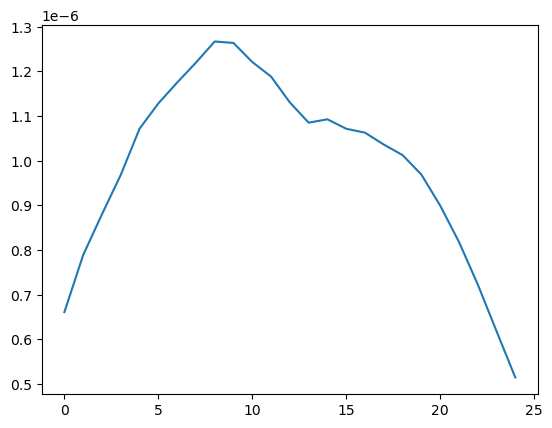

In [14]:
plt.plot(nograting_cube.mean(dim=(0,2,3)).cpu())

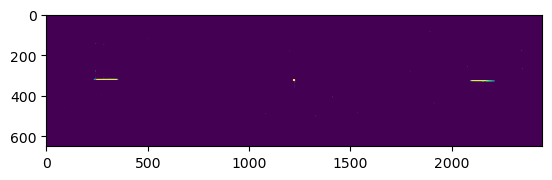

In [15]:
plt.imshow(kernel.sum(dim=(0,1)).cpu(),vmax=0.01)

### Find a multiplication factor between them?

In [16]:
cluster_points = 3

# pos = findclusters(grating_cube.cpu(),threshold=0.2, padding=100,type='boxes', cluster_points = cluster_points)


pos = torch.tensor([[[275,575],[150,500]],[[275,575],[1100,1300]],[[275,575],[2000,2300]]])

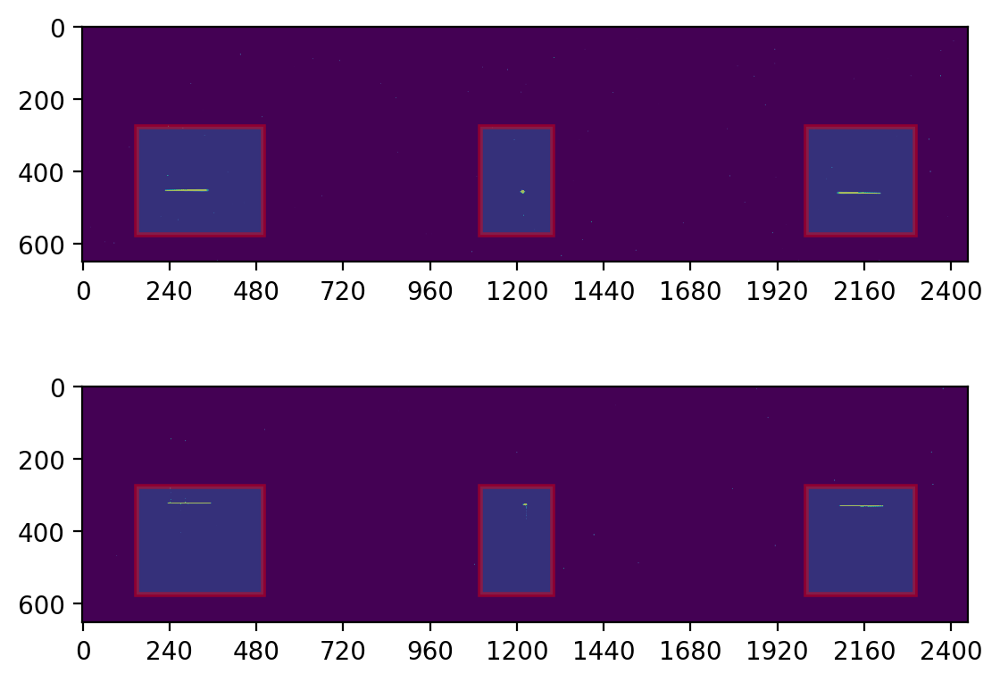

In [73]:
fig,ax = plt.subplots(2,1,dpi=200)
ax[0].imshow(torch.sum((grating_cube)[0],dim=0).cpu().detach().numpy(),vmax=0.01)
ax[1].imshow(torch.sum((kernel)[0],dim=0).cpu().detach().numpy(),vmax=0.01)

ax[0].set_xticks(np.linspace(0,2400,11));
ax[1].set_xticks(np.linspace(0,2400,11));

import matplotlib.patches as patch

for i in range(cluster_points):
    ax[0].add_patch(patch.Rectangle([pos[i,1,0],pos[i,0,0]],pos[i,1,1] - pos[i,1,0],pos[i,0,1] - pos[i,0,0], facecolor=None, ec='r',alpha=0.4, lw=2))
    ax[1].add_patch(patch.Rectangle([pos[i,1,0],pos[i,0,0]],pos[i,1,1] - pos[i,1,0],pos[i,0,1] - pos[i,0,0], facecolor=None, ec='r',alpha=0.4, lw=2))



In [74]:
grating_cube.mean(), nograting_cube.mean()

(tensor(9.9485e-07, device='cuda:0'), tensor(9.9485e-07, device='cuda:0'))

In [76]:
scaled_kernel = kernel.clone()


init_guess = fwd.disperser.disperse_all_orders(nograting_cube,kernel )

for i in range(cluster_points):
    fac = grating_cube[:,:,pos[i,0,0]:pos[i,0,1],pos[i,1,0]:pos[i,1,1]].mean(dim=(0,2,3)) / init_guess[:,:,pos[i,0,0]:pos[i,0,1],pos[i,1,0]:pos[i,1,1]].mean(dim=(0,2,3))

    scaled_kernel[:,:,pos[i,0,0]:pos[i,0,1],pos[i,1,0]:pos[i,1,1]] = scaled_kernel[:,:,pos[i,0,0]:pos[i,0,1],pos[i,1,0]:pos[i,1,1]] * fac[None,:,None,None]


In [77]:
from models.custom.modules import CenterOfMassLoss

In [78]:
init_guess = fwd.disperser.disperse_all_orders(nograting_cube,scaled_kernel) 

for i in range(cluster_points):
    print(i)
    
    loss_fn2 = CenterOfMassLoss(pos[i:i+1], intensity_factor= 3, funda_weight=1, channels=desired_channels, funda_index=1) 
    print(loss_fn2(grating_cube,init_guess))



model = AffineTransformModel(region = pos, rot=0., transX=0., transY=0.,scale=False, no_channels=desired_channels).to(device)

loss_fn1 = torch.nn.MSELoss()
loss_fn2 = CenterOfMassLoss(pos, intensity_factor= 3, funda_weight=1, channels=desired_channels) 


loss = loss_fn1(init_guess,grating_cube) + loss_fn2(init_guess,grating_cube)  * 1e-5






torch.cuda.empty_cache()


0
tensor(0.7141, device='cuda:0')
1
tensor(2.3855, device='cuda:0')
2
tensor(1.1489, device='cuda:0')


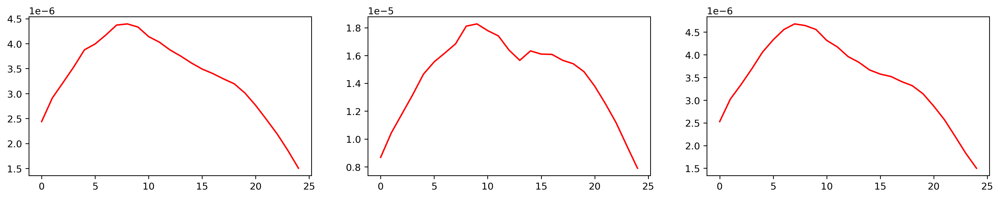

In [79]:
fig,ax = plt.subplots(1,cluster_points,figsize=(18,3),dpi=260)

for i in range(cluster_points):
    b1,b2 = pos[i,0]#[1600,1800]
    b3,b4 = pos[i,1]


    ax[i].plot(kernel[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T,'r');
    # print(kernel[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T)


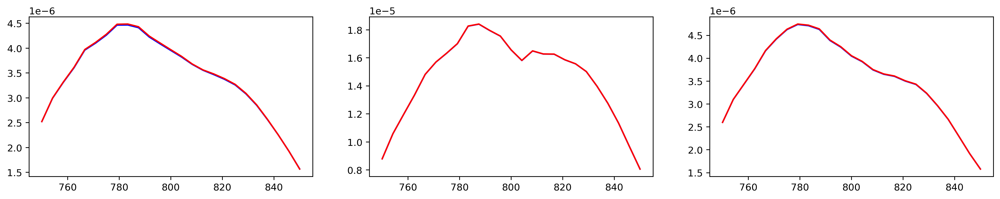

In [80]:
yhat_init = fwd.disperser.disperse_all_orders(nograting_cube,scaled_kernel)

fig,ax = plt.subplots(1,cluster_points,figsize=(18,3),dpi=260)

for i in range(cluster_points):
    b1,b2 = pos[i,0]#[1600,1800]
    b3,b4 = pos[i,1]


    
    ax[i].plot(np.linspace(desired_range[0],desired_range[1],desired_channels),grating_cube[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T,'b');
    ax[i].plot(np.linspace(desired_range[0],desired_range[1],desired_channels),yhat_init[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T,'r');

In [81]:
model.fit_angles(truth = grating_cube, init_guess=init_guess, funda_idx = cluster_points//2)
affine_kernel = model(scaled_kernel)
    
yhat_rot = fwd.disperser.disperse_all_orders(nograting_cube,affine_kernel)


/home/s/Sunny.Howard/SCI/models/custom/model.py:435: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.rot_list[i] = torch.tensor(angle_t - angle_g)


In [82]:
model.fit_translation(truth = grating_cube, init_guess=yhat_rot, intensity_factor = 2)

affine_kernel = model(scaled_kernel)    
yhat_rot_trans = fwd.disperser.disperse_all_orders(nograting_cube,affine_kernel)

In [83]:
store2 = torch.zeros((cluster_points,2,2))

for i in range(cluster_points):
    diff = []

    for l in range(3):
        guess = loss_fn2.calculate_center_of_mass(yhat_rot_trans[:,l],region = pos[i])
        true = loss_fn2.calculate_center_of_mass(grating_cube[:,l],region = pos[i])

        diff.append(true - guess)

    diff = torch.stack(diff)

    store2[i,0] = torch.mean(diff,dim=0)
    store2[i,1] = torch.std(diff,dim=0)
    

In [84]:
store2

tensor([[[ 0.7575,  0.1868],
         [ 0.1280,  0.1024]],

        [[ 0.4217,  0.1787],
         [ 0.1529,  0.0069]],

        [[-0.2405,  0.1514],
         [ 0.0766,  0.0782]]], grad_fn=<CopySlices>)

In [85]:
lr = 3e-4
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

epochs = 300

In [86]:
history = {} # Collects per-epoch loss and acc like Keras' fit().
history['loss'] = []
history['mse'] = []



start_time_sec = time.time()
num_train_examples = 1

for epoch in range(1, epochs+1):
    torch.cuda.empty_cache()


    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    optimizer.zero_grad()


    affine_kernel = model(scaled_kernel)
    
    yhat = fwd.disperser.disperse_all_orders(nograting_cube,affine_kernel)

    mse = loss_fn1(yhat, grating_cube)
    
    loss =  mse + loss_fn2(yhat, grating_cube[:,:]) * 1e-5
    # loss =  loss_fn2(yhat, grating_cube)  

    loss.backward()
    optimizer.step()

    train_loss        = loss.data.item() * grating_cube.size(0)
    train_mse        = mse.data.item() * grating_cube.size(0)





    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec
    print(f'Epoch {epoch}/{epochs}: , train loss: {(train_loss/num_train_examples):5.5g}, train mse: {(train_mse/num_train_examples):5.5g}, epoch time: {total_time_sec:5.5g}',end='\r')



    history['loss'].append(train_loss)
    history['mse'].append(train_mse)


KeyboardInterrupt: 

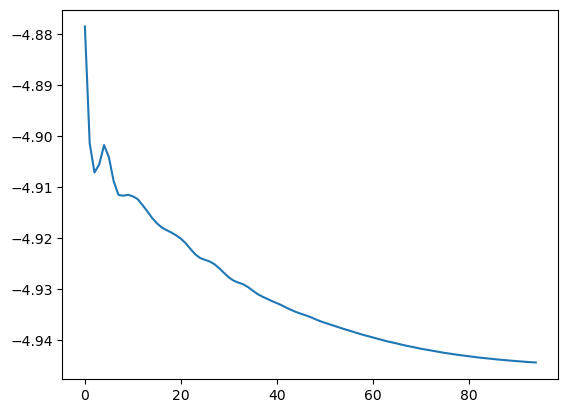

In [87]:
plt.plot(np.log10(history['loss']))


In [88]:
init_guess = fwd.disperser.disperse_all_orders(nograting_cube,kernel)

affine_kernel = model(scaled_kernel)
yhat = fwd.disperser.disperse_all_orders(nograting_cube,affine_kernel)


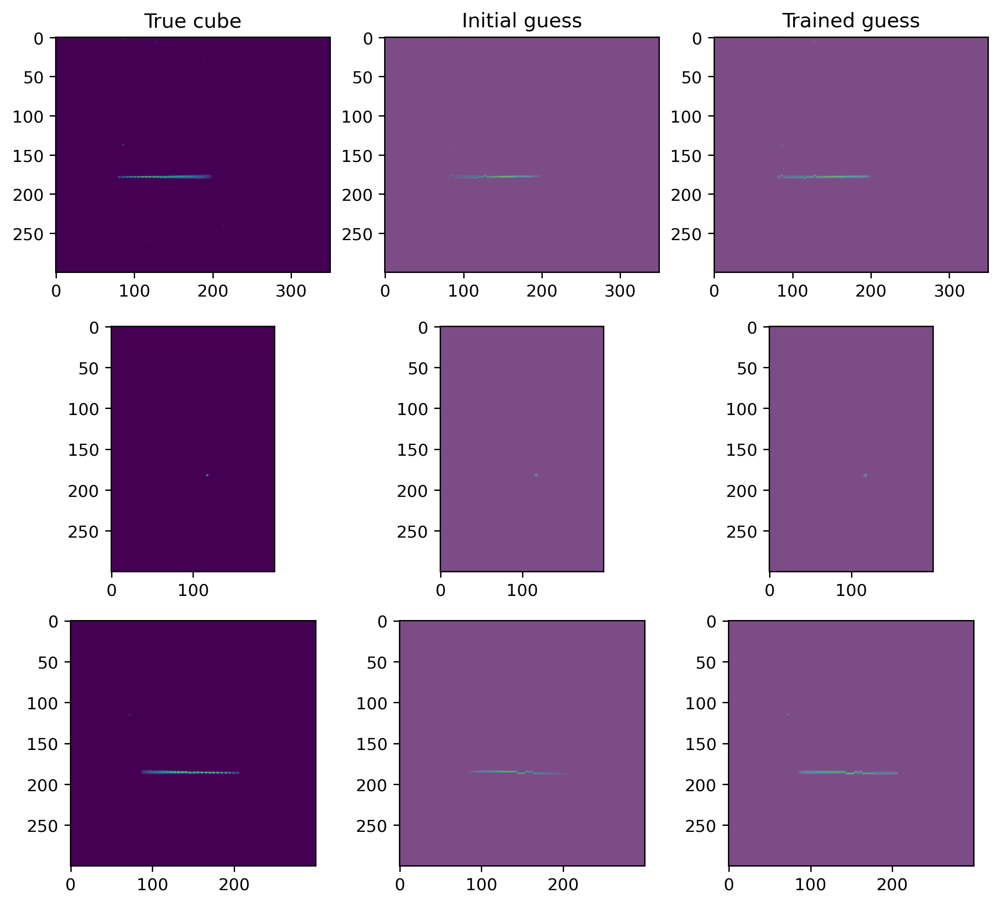

In [89]:
plot_orders = [0,1,2]

fig,ax = plt.subplots(len(plot_orders),3,figsize=(10,9),dpi=260)

for n,i in enumerate(plot_orders):
    b1,b2 = pos[i,0]#[1600,1800]
    b3,b4 = pos[i,1]#[200,400]
    
    vmax,vmin = torch.sum(grating_cube[0,:,b1:b2,b3:b4],dim=0).max(), torch.sum(grating_cube[0,:,b1:b2,b3:b4],dim=0).min()


    ax[n,0].imshow(torch.sum(grating_cube[0,:,b1:b2,b3:b4],dim=0).cpu().detach().numpy()); ax[0,0].set_title('True cube')
    ax[n,1].imshow(torch.sum(init_guess[0,:,b1:b2,b3:b4],dim=0).cpu().detach().numpy()); ax[0,1].set_title('Initial guess')
    ax[n,1].imshow(torch.sum(grating_cube[0,:,b1:b2,b3:b4],dim=0).cpu().detach().numpy(),cmap='Greys',alpha=0.3)
    ax[n,2].imshow(torch.sum(yhat[0,:,b1:b2,b3:b4],dim=0).cpu().detach().numpy()); ax[0,2].set_title('Trained guess')
    ax[n,2].imshow(torch.sum(grating_cube[0,:,b1:b2,b3:b4],dim=0).cpu().detach().numpy(),cmap='Greys',alpha=0.3)




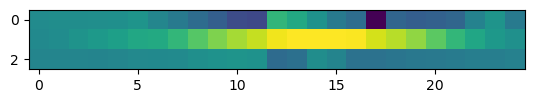

In [90]:
plt.imshow(model.grating_spectrum.cpu().detach())

tensor(1.9274e-09) tensor(0.)
tensor(2.6157e-10) tensor(0.)


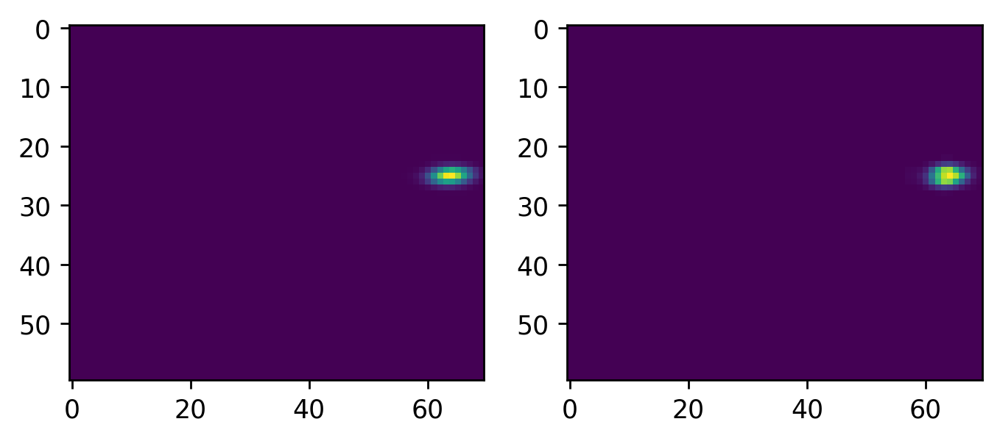

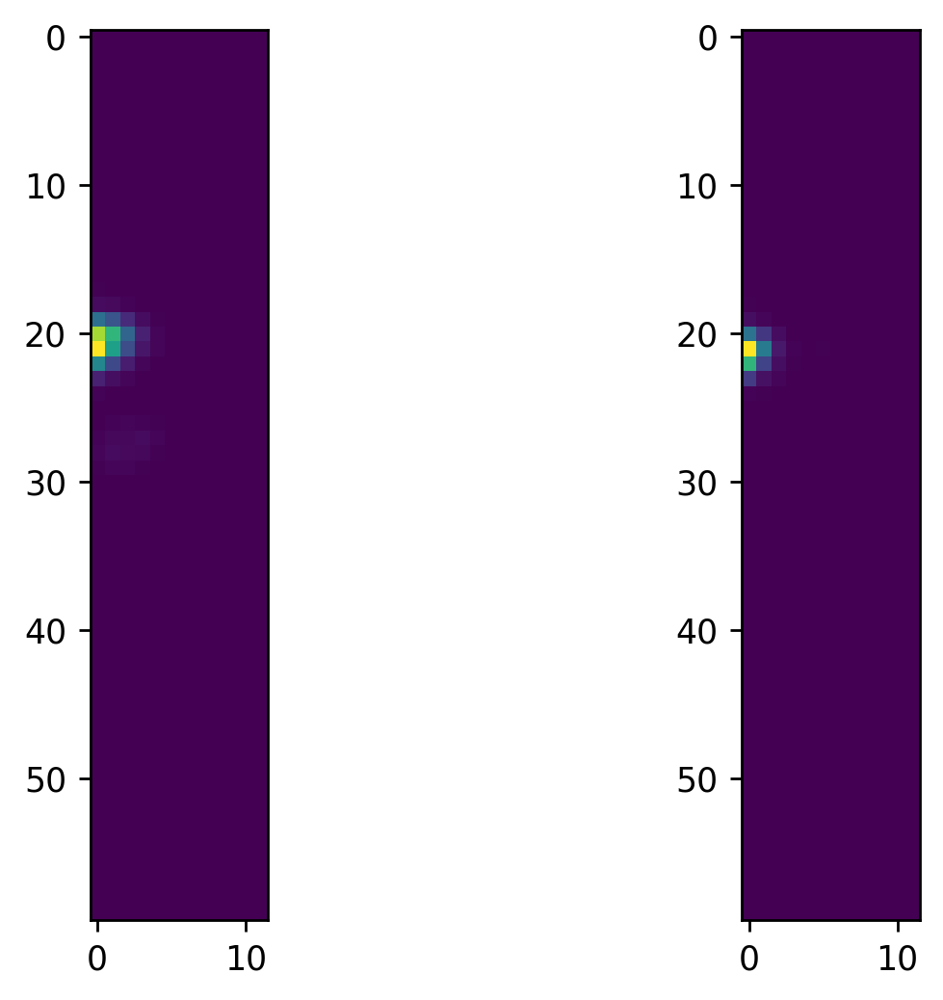

In [91]:
fig,ax = plt.subplots(1,2,dpi=250)
ax[0].imshow(yhat[0,5,435:495,2050:2120].cpu().detach().numpy())
ax[1].imshow(grating_cube[0,5,435:495,2050:2120].cpu().detach().numpy())

print(yhat[0,0,398:425,2090:2120].cpu().detach().sum() , grating_cube[0,0,398:425,2090:2120].cpu().detach().sum())

fig,ax = plt.subplots(1,2,dpi=250)
ax[0].imshow(yhat[0,1,435:495,1218:1230].cpu().detach().numpy())
ax[1].imshow(grating_cube[0,1,435:495,1218:1230].cpu().detach().numpy())

print(yhat[0,1,398:408,1218:1230].cpu().detach().sum() , grating_cube[0,1,398:408,1218:1230].cpu().detach().sum())

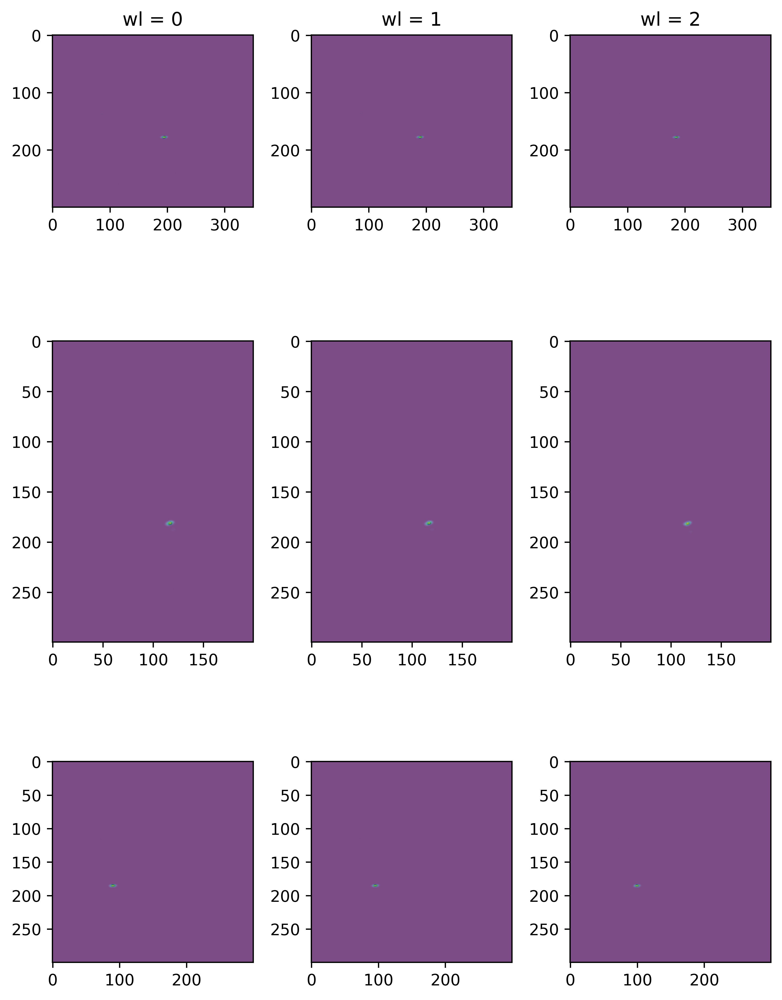

In [92]:
wls = [0,1,2]


fig,ax = plt.subplots(cluster_points,3,figsize=(7,10),dpi=560)

for j in range(len(wls)):
    ax[0,j].set_title(f'wl = {wls[j]}')

for i in range(len(pos)):
    b1,b2 = pos[i,0]#[1600,1800]
    b3,b4 = pos[i,1]
    for j in range(len(wls)):# com = loss_fn2.calculate_center_of_mass(grating_cube[:,wls[j]],pos[i]).cpu().detach().numpy()
        # ax[i,j].plot(com[0][1],com[0][0],'r.',markersize=0.2)
        ax[i,j].imshow(yhat[0,wls[j],b1:b2,b3:b4].cpu().detach().numpy())
        ax[i,j].imshow(grating_cube[0,wls[j],b1:b2,b3:b4].cpu().detach().numpy(),cmap='Greys',alpha=0.3)

fig.tight_layout()

In [35]:
# plt.plot(model.grating_spectrum.detach().cpu().T);

In [93]:
yhat_affine = yhat.clone()

In [94]:
torch.save(affine_kernel, '../affine_kernel.pt')

In [96]:
lr = 3e-3
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

epochs = 300

In [97]:
history = {} # Collects per-epoch loss and acc like Keras' fit().
history['loss'] = []
history['mse'] = []



start_time_sec = time.time()
num_train_examples = 1

for epoch in range(1, epochs+1):
    torch.cuda.empty_cache()


    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    optimizer.zero_grad()


    affine_kernel = model(scaled_kernel)
    
    yhat = fwd.disperser.disperse_all_orders(mask_nograting_cube,affine_kernel)

    mse = loss_fn1(yhat, mask_grating_cube)
    
    loss =  mse + loss_fn2(yhat, mask_grating_cube[:,:]) * 1e-5
    # loss =  loss_fn2(yhat, grating_cube)  

    loss.backward()
    optimizer.step()

    train_loss        = loss.data.item() * grating_cube.size(0)
    train_mse        = mse.data.item() * grating_cube.size(0)





    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec
    print(f'Epoch {epoch}/{epochs}: , train loss: {(train_loss/num_train_examples):5.5g}, train mse: {(train_mse/num_train_examples):5.5g}, epoch time: {total_time_sec:5.5g}',end='\r')



    history['loss'].append(train_loss)
    history['mse'].append(train_mse)

KeyboardInterrupt: 

## Now that the kernel is in the right position spatially, we make the whole thing trainable.

In [102]:
affine_kernel = torch.load('../affine_kernel.pt',map_location=device).requires_grad_(False)


Text(0.5, 1.0, '+1 integrate affine kernel')

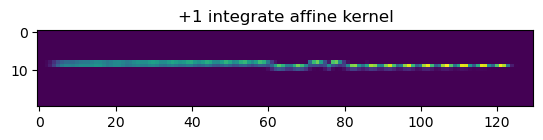

In [103]:
plt.imshow(affine_kernel[0,:,320:340,2090:2220].sum(0).cpu().detach()); plt.title('+1 integrate affine kernel')

In [104]:
torch.where(nograting_cube[0] == nograting_cube[0].max())

(tensor([13], device='cuda:0'),
 tensor([457], device='cuda:0'),
 tensor([1217], device='cuda:0'))

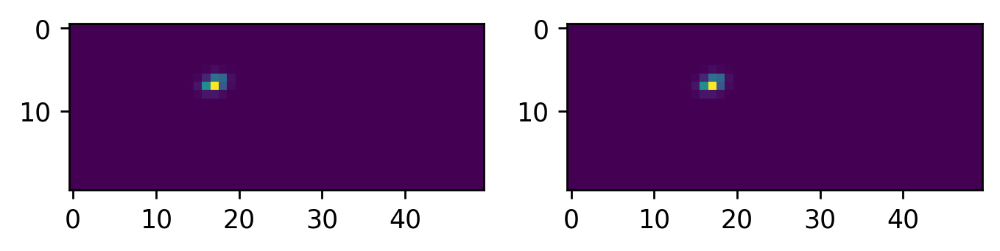

In [106]:
fig,ax = plt.subplots(1,2,dpi=250)
ax[0].imshow(nograting_cube.sum(dim=(0)).cpu().detach().numpy()[9,450:470,1200:1250])
ax[1].imshow(grating_cube.sum(dim=(0)).cpu().detach().numpy()[9,450:470,1200:1250])

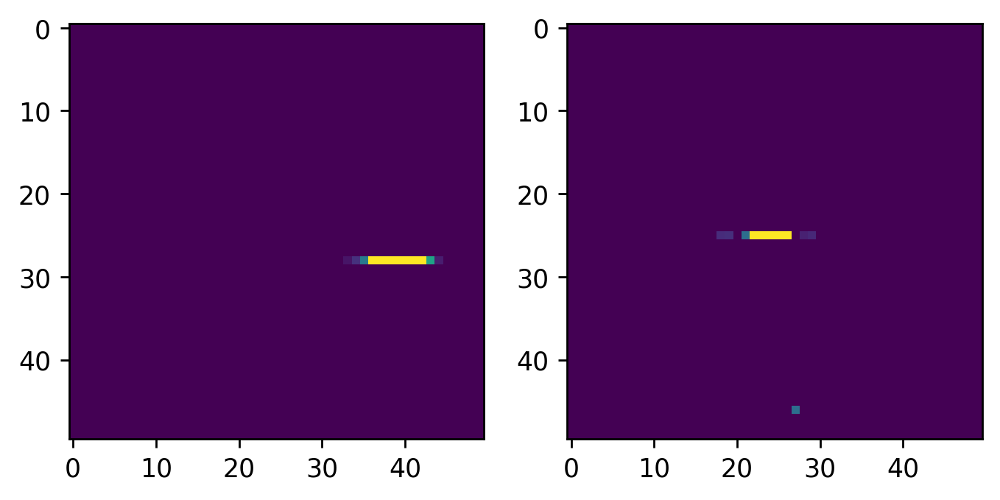

In [107]:
fig,ax = plt.subplots(1,2,dpi=250)
ax[0].imshow(kernel.sum(dim=(0)).cpu().detach().numpy()[9,300:350,2100:2150],vmax=0.01)
ax[1].imshow(kernel.sum(dim=(0)).cpu().detach().numpy()[9,300:350,1200:1250],vmax=0.01)

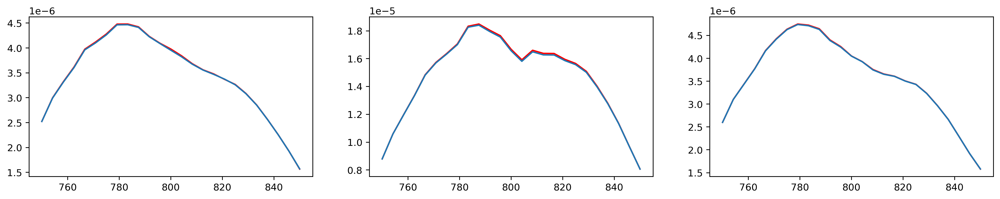

In [108]:
yhat_affine = fwd.disperser.disperse_all_orders(nograting_cube,affine_kernel)

fig,ax = plt.subplots(1,cluster_points,figsize=(18,3),dpi=260)

for i in range(cluster_points):
    b1,b2 = pos[i,0]#[1600,1800]
    b3,b4 = pos[i,1]


    ax[i].plot(np.linspace(desired_range[0],desired_range[1],desired_channels),yhat_affine[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T,'r');
    ax[i].plot(np.linspace(desired_range[0],desired_range[1],desired_channels),grating_cube[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T);

In [109]:
yhat_affine = fwd.disperser.disperse_all_orders(nograting_cube,affine_kernel)

In [110]:
padding = 1


fine_model = KernelLearner(kernel=affine_kernel.clone(), padding=padding).to(device) 
# fine_model = GratingModulationLearner(kernel = affine_kernel.clone(), regions = pos).to(device)


init_deconv_kernel = torch.zeros_like(affine_kernel)

x = [-1,0,1]
y = [-1,0,1]
xx,yy = np.meshgrid(x,y)

gaussian = np.exp(-(xx**2 + yy**2)/0.5**2)
gaussian = gaussian / gaussian.sum()

nx,ny = affine_kernel.shape[-2:]


init_deconv_kernel[:,:,nx//2-1:nx//2+2,ny//2-1:ny//2+2] = torch.tensor(gaussian)


deconv_model = KernelLearner(kernel=init_deconv_kernel, padding=0).to(device)

lr = 4e-2
epochs = 1300

optimizer = torch.optim.Adam(list(fine_model.parameters()) + list(deconv_model.parameters()), lr=lr)

init_guess = fine_model(nograting_cube)

loss_fn = torch.nn.MSELoss()

loss = loss_fn(init_guess,grating_cube)
print(loss)

tensor(1.5886e-08, device='cuda:0', grad_fn=<MseLossBackward0>)


In [111]:
history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []





start_time_sec = time.time()

for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    fine_model.train()
    deconv_model.train()
    num_train_examples = 1

    optimizer.zero_grad()

    deconved_nograting = nograting_cube#deconv_model.forward_inverse(nograting_cube)
    # deconved_nograting = deconv_model.forward_inverse(nograting_cube)
    
    yhat = fine_model(deconved_nograting)
    # yhat_mask = fine_model(mask_nograting_cube)


    loss = loss_fn(yhat, grating_cube) #+ loss_fn(yhat_mask, mask_grating_cube) 

    loss.backward()
    optimizer.step()

    train_loss         = loss.data.item() * grating_cube.size(0)
    


    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g}, epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)


    


KeyboardInterrupt: 

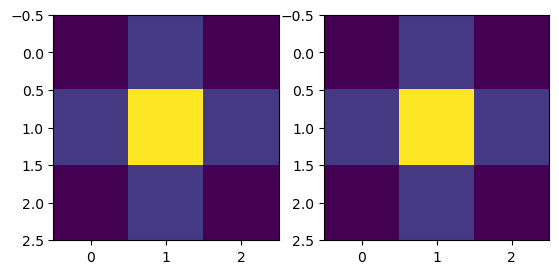

In [112]:
deconv_kernel  = deconv_model.fill_kernel()
nonzero_indices = torch.where(deconv_kernel != 0)
x_min, x_max = nonzero_indices[2].min(), nonzero_indices[2].max()
y_min, y_max = nonzero_indices[3].min(), nonzero_indices[3].max()

fig,ax = plt.subplots(1,2)
ax[0].imshow(gaussian, vmax = 0.1)
ax[1].imshow(deconv_kernel[0, 0, x_min:x_max+1, y_min:y_max+1].cpu().detach().numpy(),vmax=0.1)


Text(0.5, 0, 'Epochs')

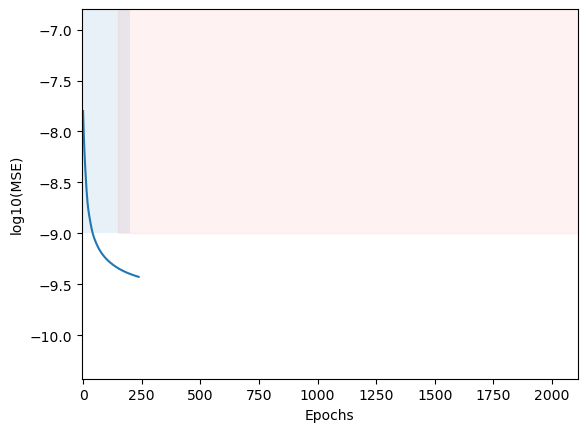

In [113]:

mina, maxa = np.log10(history2['mse']).min(), np.log10(history2['mse']).max()

plt.plot(np.log10(history2['mse']))
# plt.plot(np.log10(history['mse']+history2['mse']))
plt.fill_betweenx(np.linspace(-9,1,100),-1,200,alpha=0.1)
plt.fill_betweenx(np.linspace(-9,1,100),150,2109,color='r',alpha=0.05)

plt.xlim([-5,2110])
plt.ylim([mina-1,maxa+1])
plt.ylabel('log10(MSE)')
plt.xlabel('Epochs')

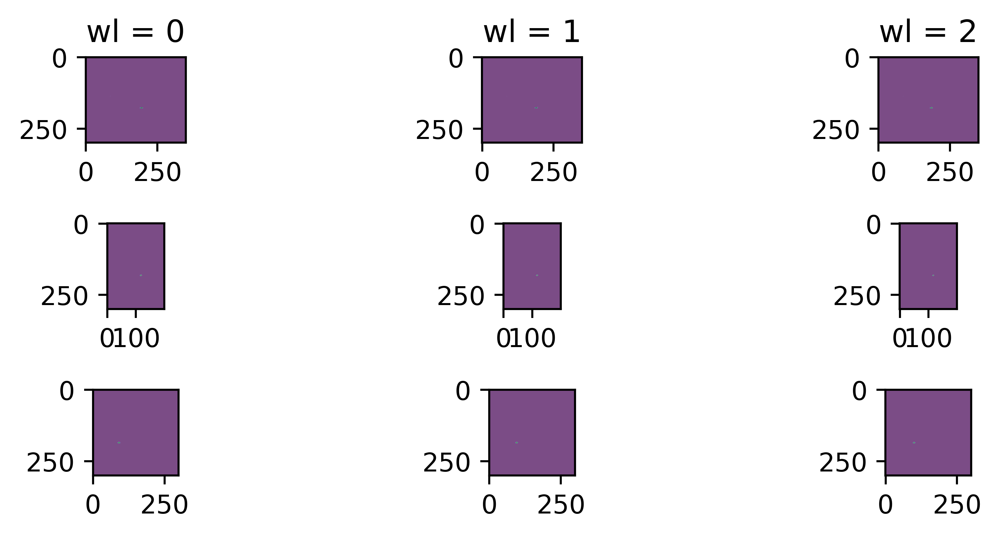

In [114]:
trained_kernel = fine_model.fill_kernel()

wls = [0,1,2]#[5,15,15,25,35]

b1,b2 = pos[0,0]#[1600,1800]
b3,b4 = pos[0,1]

# CoMs = loss_fn2.calculate_center_of_mass(grating_cube[0], region = pos[0]).cpu()

fig,ax = plt.subplots(cluster_points,3,figsize=(7,cluster_points),dpi=560)

for j in range(len(wls)):
    ax[0,j].set_title(f'wl = {wls[j]}')

for i in range(cluster_points):
    b1,b2 = pos[i,0]#[1600,1800]
    b3,b4 = pos[i,1]
    for j in range(len(wls)):
        
        ax[i,j].imshow(yhat[0,wls[j],b1:b2,b3:b4].cpu().detach().numpy())
        ax[i,j].imshow(grating_cube[0,wls[j],b1:b2,b3:b4].cpu().detach().numpy(),cmap='Greys',alpha=0.3)

fig.tight_layout()

################


In [115]:
print(loss_fn(yhat_affine[...,:700],grating_cube[...,:700]).cpu().numpy(), loss_fn(yhat[...,:700],grating_cube[...,:700]).detach().cpu().numpy())
print(loss_fn(yhat_affine[...,700:1700],grating_cube[...,700:1700]).cpu().numpy(), loss_fn(yhat[...,700:1700],grating_cube[...,700:1700]).detach().cpu().numpy())
print(loss_fn(yhat_affine[...,1700:],grating_cube[...,1700:]).cpu().numpy(), loss_fn(yhat[...,1700:],grating_cube[...,1700:]).detach().cpu().numpy())


2.3800342e-09 5.0941196e-10
3.5651635e-08 2.6437072e-10
2.0992188e-09 3.9180043e-10


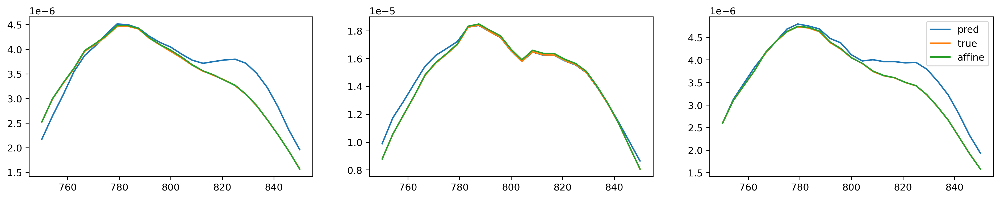

In [116]:
yhat = fwd.disperser.disperse_all_orders(nograting_cube,trained_kernel)

fig,ax = plt.subplots(1,cluster_points,figsize=(18,3),dpi=260)

for i in range(cluster_points):
    b1,b2 = pos[i,0]#[1600,1800]
    b3,b4 = pos[i,1]


    ax[i].plot(np.linspace(desired_range[0],desired_range[1],desired_channels),yhat[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T);
    ax[i].plot(np.linspace(desired_range[0],desired_range[1],desired_channels),grating_cube[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T);
    ax[i].plot(np.linspace(desired_range[0],desired_range[1],desired_channels),yhat_affine[0,:,b1:b2,b3:b4].mean(dim=(2,1)).cpu().detach().numpy().T);
    plt.legend(['pred','true','affine'])

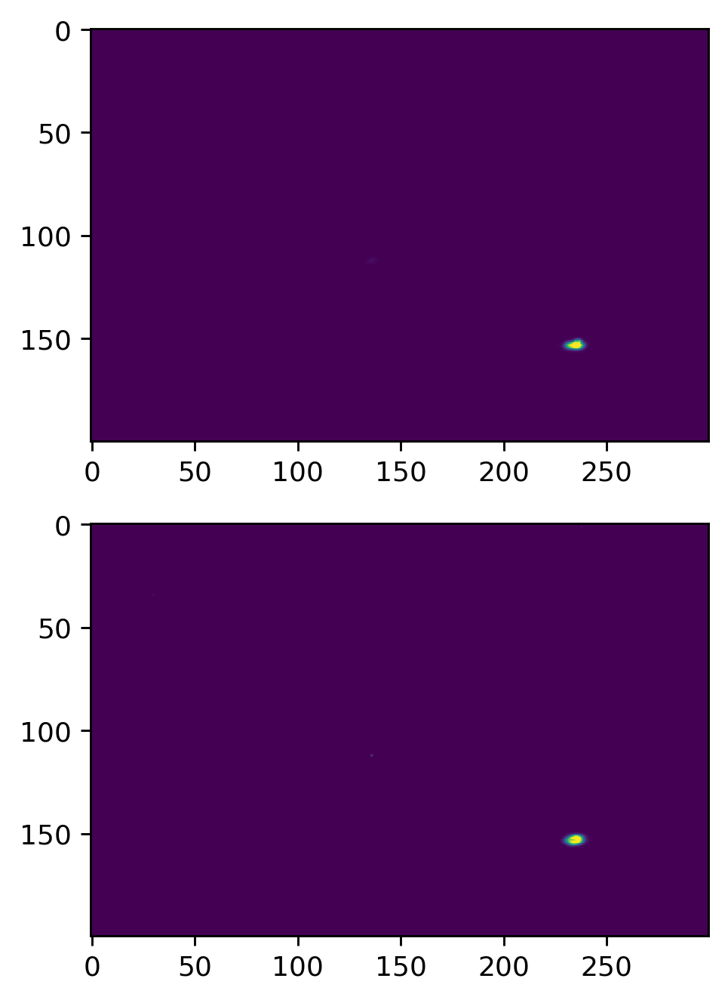

In [117]:
wl = 2

fig,ax = plt.subplots(2,1,figsize=(10,6),dpi=260)
ax[0].imshow(torch.abs( yhat)[0,2,300:500,100:400].cpu().detach().numpy(),vmax=0.01)
ax[1].imshow(torch.abs(grating_cube )[0,2,300:500,100:400].cpu().detach().numpy(),vmax=.01)

In [118]:
torch.save(trained_kernel, '../kernel_mono.pt')


In [119]:
# kernel = torch.load('../kernel_mono.pt',map_location=device).requires_grad_(False)
kernel = torch.load('../affine_kernel.pt',map_location=device).requires_grad_(False)

init_deconv_kernel = torch.zeros_like(kernel)
x = np.linspace(-1,1,9)
y = np.linspace(-1,1,9)
xx,yy = np.meshgrid(x,y)

gaussian = np.exp(-(xx**2 + yy**2)/.2**2)
gaussian = gaussian / gaussian.sum()

nx,ny = affine_kernel.shape[-2:]


init_deconv_kernel[:,:,nx//2-4:nx//2+5,ny//2-4:ny//2+5] = torch.tensor(gaussian)
# init_deconv_kernel[:,:,nx//2-5:nx//2+4,ny//2-5:ny//2+4] = torch.tensor(gaussian)


deconv_model = KernelLearner(kernel=init_deconv_kernel, padding=0).to(device)

fine_model = KernelLearner(kernel=kernel, padding=2).to(device)

loss_fn = torch.nn.MSELoss()


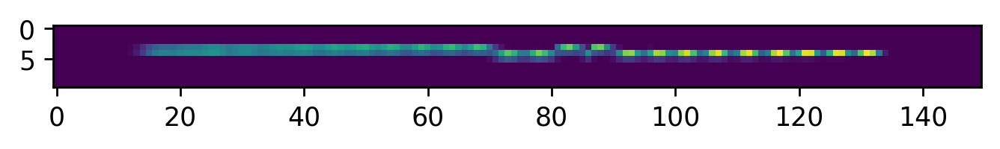

In [125]:
plt.figure(dpi=250)
plt.imshow(affine_kernel[0,:,325:335,2080:2230].sum(0).cpu().detach().numpy())

## Now we have a dispersion kernel... Lets correct for distortion *before* we do dispersion 

In [17]:
# make three copies of the kernel, one for each order

# kernel = torch.load('../kernel_mask.pt',map_location=device).requires_grad_(False)
kernel = torch.load('../affine_kernel.pt',map_location=device).requires_grad_(False)
nx,ny = mask_nograting_cube.shape[2:]

mask_nograting_funda = mask_nograting_cube[...,ny//2-320:ny//2+320].clone()

pad = (ny//2-320,  ny - (ny//2+320))

minus1_kernel = kernel.clone()
minus1_kernel[...,800:] = 0

plus1_kernel = kernel.clone()
plus1_kernel[...,:-800] = 0

funda_kernel = kernel.clone()
funda_kernel[...,-800:] = 0
funda_kernel[...,:800] = 0

deconv_kernel = kernel.clone()[...,ny//2-320:ny//2+320]

In [30]:
kernelsize=5
CG_channels = 9
loss_fn = torch.nn.MSELoss()


# initialiser = torch.rand((1,CG_channels,mask_nograting_funda.shape[2],mask_nograting_funda.shape[3]))
initialiser = torch.ones((1,CG_channels,mask_nograting_funda.shape[2],mask_nograting_funda.shape[3]))
initialiser = initialiser / CG_channels

CG_conv3dminus1 = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = mask_nograting_funda.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False, three_d=False).to(device) 
CG_conv3dplus1 = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = mask_nograting_funda.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False, three_d=False).to(device) 
CG_conv3dfunda = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = mask_nograting_funda.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False, three_d=False).to(device) 

deKlearner = KernelLearner(kernel=deconv_kernel, padding=2).to(device)

Klearner = KernelLearner(kernel=kernel, padding=2).to(device)


In [31]:
minus1 = torch.concat([CG_conv3dminus1(mask_nograting_funda[:,i:i+1]) for i in range(mask_grating_cube.shape[1])],dim=1)
plus1 = torch.concat([CG_conv3dplus1(mask_nograting_funda[:,i:i+1]) for i in range(mask_grating_cube.shape[1])],dim=1)
funda = torch.concat([CG_conv3dfunda(mask_nograting_funda[:,i:i+1]) for i in range(mask_grating_cube.shape[1])],dim=1)



distortion_corrected = torch.concat([minus1 , funda , plus1])


distortion_corrected = torch.nn.functional.pad(distortion_corrected, pad, mode='constant', value=0)


yhat = fwd.disperser.disperse_all_orders(distortion_corrected[:1],minus1_kernel) + fwd.disperser.disperse_all_orders(distortion_corrected[1:2],funda_kernel) + fwd.disperser.disperse_all_orders(distortion_corrected[2:],plus1_kernel)


In [32]:
init_guess = fwd.disperser.disperse_all_orders(mask_nograting_cube,kernel)

loss_fn(yhat,mask_grating_cube), loss_fn(init_guess,mask_grating_cube), loss_fn(fwd.disperser.disperse_all_orders(mask_nograting_cube,kernel)[:,11],mask_grating_cube[:,11])

(tensor(0.0046, device='cuda:0', grad_fn=<MseLossBackward0>),
 tensor(4.2673e-05, device='cuda:0'),
 tensor(6.5190e-05, device='cuda:0'))

In [33]:
lr = 5e-3
epochs = 10000
init_reg_factor =  8e-7
wl=11

all_params = list(CG_conv3dminus1.parameters()) + list(CG_conv3dplus1.parameters()) + list(CG_conv3dfunda.parameters()) + list(Klearner.parameters()) + list(deKlearner.parameters())

optimizer = torch.optim.Adam(all_params, lr=lr)

history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []

start_time_sec = time.time()

# TVweight = np.append(np.ones(epochs//4) * 1e-5, np.logspace(-5,-10,epochs - epochs//4))

for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    CG_conv3dminus1.train()
    CG_conv3dplus1.train()
    Klearner.train()
    # deKlearner.train()
    CG_conv3dfunda.train()
    num_train_examples = 1

    optimizer.zero_grad()

    deconvolved_funda = mask_nograting_funda[:,wl:wl+1]#deKlearner.forward_inverse(mask_nograting_funda[:,wl:wl+1])   

    minus1 = CG_conv3dminus1(deconvolved_funda)
    plus1 = CG_conv3dplus1(deconvolved_funda) 
    funda = CG_conv3dfunda(deconvolved_funda)

    distortion_corrected = torch.concat([minus1 ,funda , plus1])


    distortion_corrected = torch.nn.functional.pad(distortion_corrected, pad, mode='constant', value=0)

    newkernel = Klearner.fill_kernel()

    minus1_kernel = newkernel.clone()
    minus1_kernel[...,800:] = 0

    plus1_kernel = newkernel.clone()
    plus1_kernel[...,:-800] = 0

    funda_kernel = newkernel.clone()
    funda_kernel[...,-800:] = 0
    funda_kernel[...,:800] = 0

    yhat = fwd.disperser.disperse_all_orders(distortion_corrected[:1],minus1_kernel[:,wl:wl+1]) + fwd.disperser.disperse_all_orders(distortion_corrected[1:2],funda_kernel[:,wl:wl+1]) + fwd.disperser.disperse_all_orders(distortion_corrected[2:],plus1_kernel[:,wl:wl+1])

    
    # reg = hessian(torch.nn.functional.relu(CG_conv3dminus1.CG.map),norm=3) + hessian(torch.nn.functional.relu(CG_conv3dplus1.CG.map),norm=3) + hessian(torch.nn.functional.relu(CG_conv3dfunda.CG.map),norm=3)
    reg = first_deriv(torch.nn.functional.relu(CG_conv3dminus1.CG.map),norm=3) + first_deriv(torch.nn.functional.relu(CG_conv3dplus1.CG.map),norm=3) + first_deriv(torch.nn.functional.relu(CG_conv3dfunda.CG.map),norm=3)


    
    mse = loss_fn(yhat,mask_grating_cube[:,wl:wl+1])
    loss = mse + reg * init_reg_factor

    loss.backward()
    optimizer.step()

    with torch.no_grad():
        for parameter in CG_conv3dminus1.parameters():
            parameter.clamp_(min=0,max=1)

        for parameter in CG_conv3dfunda.parameters():
            parameter.clamp_(min=0,max=1)

        for parameter in CG_conv3dplus1.parameters():
            parameter.clamp_(min=0,max=1)

    train_loss         = loss.data.item() * mask_grating_cube.size(0)
    


    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g},train mse: {mse:5.5g}, train reg: {reg*init_reg_factor:5.5g}  epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)

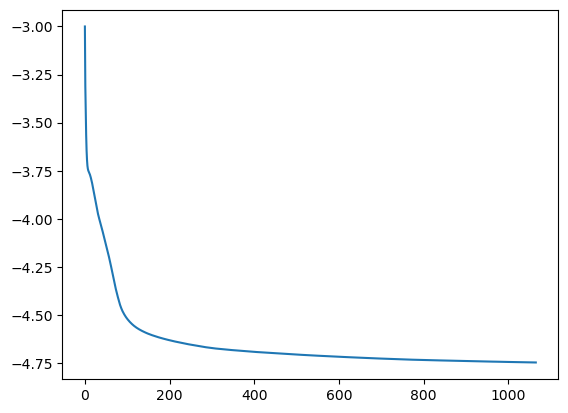

In [22]:
plt.plot(np.log10(history2['mse']))

In [23]:
newkernel = Klearner.fill_kernel()
deconv_kernel = deKlearner.fill_kernel()

In [24]:
# plt.imshow(deconv_kernel.sum((0,1)).cpu().detach()[320:330,300:350],vmax=0.001)

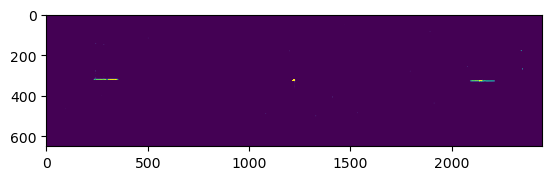

In [26]:
plt.imshow(newkernel.sum((0,1)).cpu().detach(),vmax=0.01)

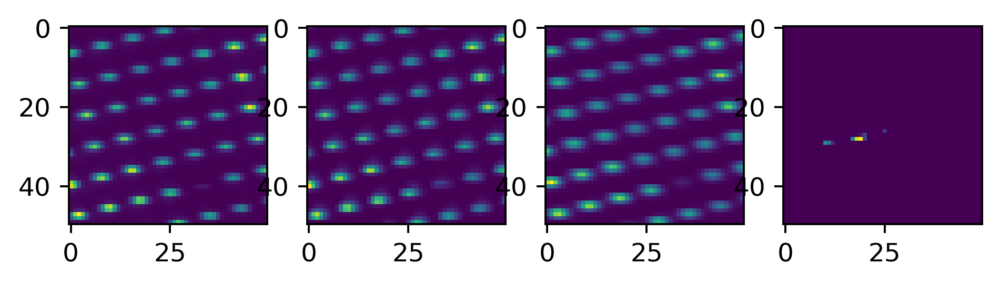

In [27]:
fig,ax = plt.subplots(1,4,dpi=350)
ax[0].imshow(mask_grating_cube[0,11,400:450,2050:2100].cpu().detach().numpy())
ax[1].imshow(yhat[0,0,400:450,2050:2100].cpu().detach().numpy())
ax[2].imshow(init_guess[0,11,400:450,2050:2100].cpu().detach().numpy())
ax[3].imshow(newkernel[0,11,300:350,2130:2180].cpu().detach().numpy())

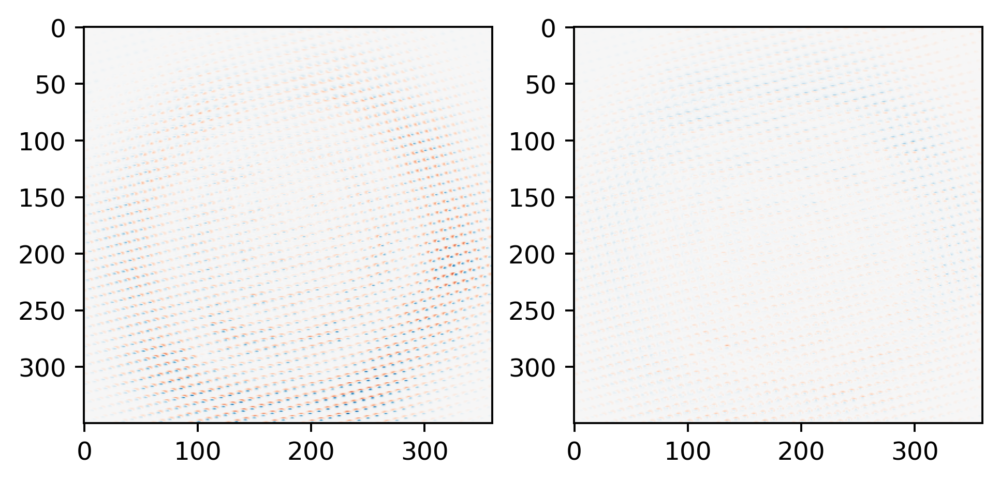

In [28]:
wl = 11
init_guess = fwd.disperser.disperse_all_orders(mask_nograting_cube,kernel)

from scipy.ndimage import gaussian_filter

blurred_truth = mask_grating_cube[:,wl].clone()
blurred_truth[0] = torch.ones_like(torch.tensor(gaussian_filter(blurred_truth[0].cpu().detach().numpy(),sigma=20)).to(device))

plot_orig = ((mask_grating_cube[0,wl,] - init_guess[0,wl])/blurred_truth[0])[150:500,1980:2340]

vmax = plot_orig.abs().max()

fig,ax = plt.subplots(1,2,dpi=350)
a = ax[0].imshow(plot_orig.cpu().detach().numpy(),cmap = 'RdBu',vmax = vmax, vmin = -vmax)

# plt.colorbar(a)
plot_final = ((mask_grating_cube[0,wl,] - yhat[0,0])/blurred_truth[0])[150:500,1980:2340]
# vmax = plot_final.abs().max()

b = ax[1].imshow(plot_final.cpu().detach().numpy(),cmap = 'RdBu',vmax = vmax, vmin = -vmax)

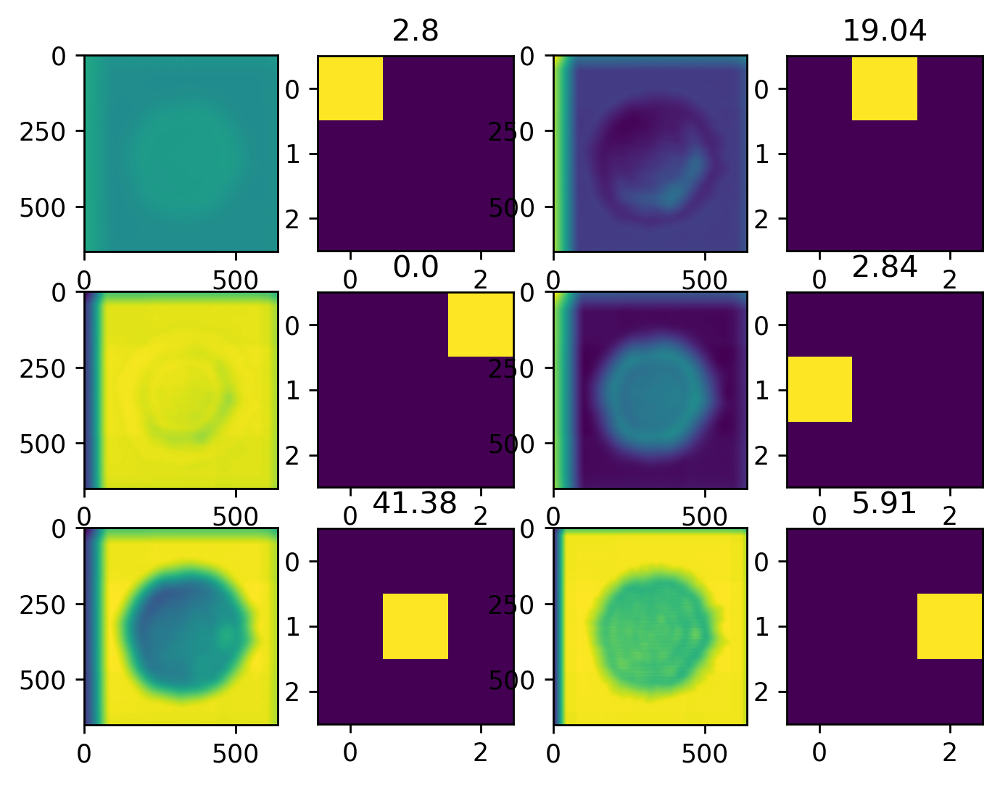

In [29]:
conv = [p for p in CG_conv3dminus1.conv.parameters()][0]
maps,coeffs = [p for p in CG_conv3dminus1.CG.parameters()][:2]
# conv = [p for p in CG_conv3dplus1.conv.parameters()][0]
# maps,coeffs = [p for p in CG_conv3dplus1.CG.parameters()][:2]
# conv = [p for p in CG_conv3dfunda.conv.parameters()][0]
# maps,coeffs = [p for p in CG_conv3dfunda.CG.parameters()][:2]

scaled_coeffs = coeffs[0,:,0,0] * conv.mean((1,2,3)) * maps.mean((0,2,3))

scaled_coeffs = scaled_coeffs / scaled_coeffs.sum()

fig,ax = plt.subplots(3,4,dpi=250)

for i in range(3):
    ax[i,0].imshow(maps.cpu().detach()[0,i*2])
    ax[i,1].imshow(conv.cpu().detach()[i*2,0]); ax[i,1].set_title(np.round(scaled_coeffs[i*2].detach().cpu().numpy()*100,2))
    ax[i,2].imshow(maps.cpu().detach()[0,i*2+1])
    ax[i,3].imshow(conv.cpu().detach()[i*2+1,0]); ax[i,3].set_title(np.round(scaled_coeffs[i*2+1].detach().cpu().numpy()*100,2))

In [62]:
lr = 4e-4
epochs = 10000
wl=11

kernel_model = KernelLearner(kernel=kernel[:,wl:wl+1].clone(), padding=1).to(device)

optimizer = torch.optim.Adam(kernel_model.parameters(), lr=lr)


history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []

start_time_sec = time.time()

distortion_corrected = distortion_corrected.detach()


for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    kernel_model.train()
    #CG_conv3dfunda.train()
    num_train_examples = 1

    optimizer.zero_grad()
    
    new_kernel = kernel_model.fill_kernel()

    minus1_kernel = new_kernel.clone()
    minus1_kernel[...,800:] = 0

    plus1_kernel = new_kernel.clone()
    plus1_kernel[...,:-800] = 0

    funda_kernel = new_kernel.clone()
    funda_kernel[...,-800:] = 0
    funda_kernel[...,:800] = 0

    #distortion_corrected were taken from using the CG models.
    yhat = fwd.disperser.disperse_all_orders(distortion_corrected[:1],minus1_kernel[:]) + fwd.disperser.disperse_all_orders(distortion_corrected[1:2],funda_kernel[:]) + fwd.disperser.disperse_all_orders(distortion_corrected[2:],plus1_kernel[:])

    
    
    mse = loss_fn(yhat,mask_grating_cube[:,wl:wl+1])
    loss = mse 

    loss.backward()
    optimizer.step()


    train_loss         = loss.data.item() * mask_grating_cube.size(0)
    


    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g},train mse: {mse:5.5g}, train reg: {reg*init_reg_factor:5.5g}  epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)

KeyboardInterrupt: 

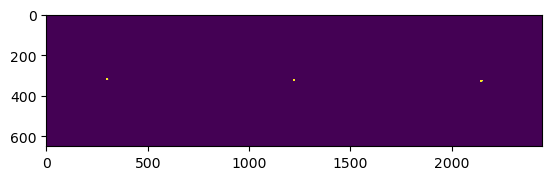

In [ ]:
plt.imshow((kernel[:,wl:wl+1] - new_kernel).abs().cpu().detach()[0,0,350:450],vmax=0.0001)

In [ ]:
funda_kernel

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], device='cuda:3',
       grad_fn=<CopySlices>)

In [ ]:

CG_conv3dminus1_l = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = mask_nograting_funda.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False, three_d=True,channels=mask_grating_cube.shape[1]).to(device) 
CG_conv3dplus1_l = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = mask_nograting_funda.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False, three_d=True,channels=mask_grating_cube.shape[1]).to(device) 

# fine_model = KernelLearner(kernel=kernel.clone(), padding=3).to(device) 

In [ ]:
CG_conv3dminus1_l.conv.load_state_dict(CG_conv3dminus1.conv.state_dict())
CG_conv3dplus1_l.conv.load_state_dict(CG_conv3dplus1.conv.state_dict())

for i in range(mask_grating_cube.shape[1]):
    CG_conv3dminus1_l.CG[i].load_state_dict(CG_conv3dminus1.CG.state_dict())
    CG_conv3dplus1_l.CG[i].load_state_dict(CG_conv3dplus1.CG.state_dict())

In [ ]:
lr = 1e-2
epochs = 3000
init_reg_factor = 1e-6


all_params = list(CG_conv3dminus1_l.parameters()) + list(CG_conv3dplus1_l.parameters())# + list(fine_model.parameters())

optimizer = torch.optim.Adam(all_params, lr=lr)

history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []

start_time_sec = time.time()

# TVweight = np.append(np.ones(epochs//4) * 1e-5, np.logspace(-5,-10,epochs - epochs//4))

for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    CG_conv3dminus1_l.train()
    CG_conv3dplus1_l.train()
    num_train_examples = 1

    optimizer.zero_grad()
    

    minus1 = CG_conv3dminus1_l(mask_nograting_funda)#torch.concat([CG_conv3dminus1(mask_nograting_funda[:,i:i+1]) for i in range(mask_grating_cube.shape[1])],dim=1)
    plus1 = CG_conv3dplus1_l(mask_nograting_funda)#torch.concat([CG_conv3dplus1(mask_nograting_funda[:,i:i+1]) for i in range(mask_grating_cube.shape[1])],dim=1)
    funda = mask_nograting_funda

    distortion_corrected = torch.concat([minus1 , funda , plus1])

    # newkernel = fine_model.fill_kernel()
    # minus1_kernel = newkernel.clone()
    # minus1_kernel[...,800:] = 0

    # plus1_kernel = newkernel.clone()
    # plus1_kernel[...,:-800] = 0

    # funda_kernel = newkernel.clone()
    # funda_kernel[...,-800:] = 0
    # funda_kernel[...,:800] = 0


    distortion_corrected = torch.nn.functional.pad(distortion_corrected, pad, mode='constant', value=0)


    yhat = fwd.disperser.disperse_all_orders(distortion_corrected[:1],minus1_kernel) + fwd.disperser.disperse_all_orders(distortion_corrected[1:2],funda_kernel) + fwd.disperser.disperse_all_orders(distortion_corrected[2:],plus1_kernel)

    
    reg = torch.mean(torch.stack([hessian(torch.nn.functional.relu(CG_conv3dminus1_l.CG[i].map)) for i in range(mask_grating_cube.shape[1])]))    
    reg += torch.mean(torch.stack([hessian(torch.nn.functional.relu(CG_conv3dplus1_l.CG[i].map)) for i in range(mask_grating_cube.shape[1])]))  


    spectral_regm1 = torch.gradient(torch.concat([torch.nn.functional.relu(CG_conv3dminus1_l.CG[i].map) for i in range(mask_grating_cube.shape[1])]), dim=0)[0]
    spectral_regm1 = torch.norm(torch.gradient(spectral_regm1,dim=0)[0],2)

    spectral_regp1 = torch.gradient(torch.concat([torch.nn.functional.relu(CG_conv3dplus1_l.CG[i].map) for i in range(mask_grating_cube.shape[1])]), dim=0)[0]
    spectral_regp1 = torch.norm(torch.gradient(spectral_regp1,dim=0)[0],2)
    reg+= spectral_regm1 + spectral_regp1

    
    mse = loss_fn(yhat,mask_grating_cube)
    loss = mse + reg * init_reg_factor

    loss.backward()
    optimizer.step()

    with torch.no_grad():
        for parameter in CG_conv3dminus1_l.parameters():
            parameter.clamp_(min=0)

        for parameter in CG_conv3dplus1_l.parameters():
            parameter.clamp_(min=0)

    train_loss         = loss.data.item() * mask_grating_cube.size(0)



    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g},train mse: {mse:5.5g}, train reg: {reg*init_reg_factor:5.5g}  epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)

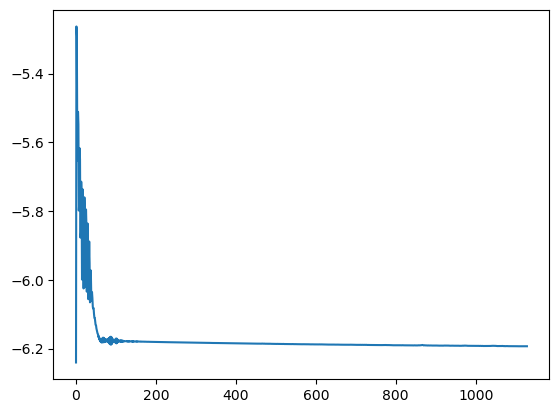

In [ ]:
plt.plot(np.log10(history2['mse']))

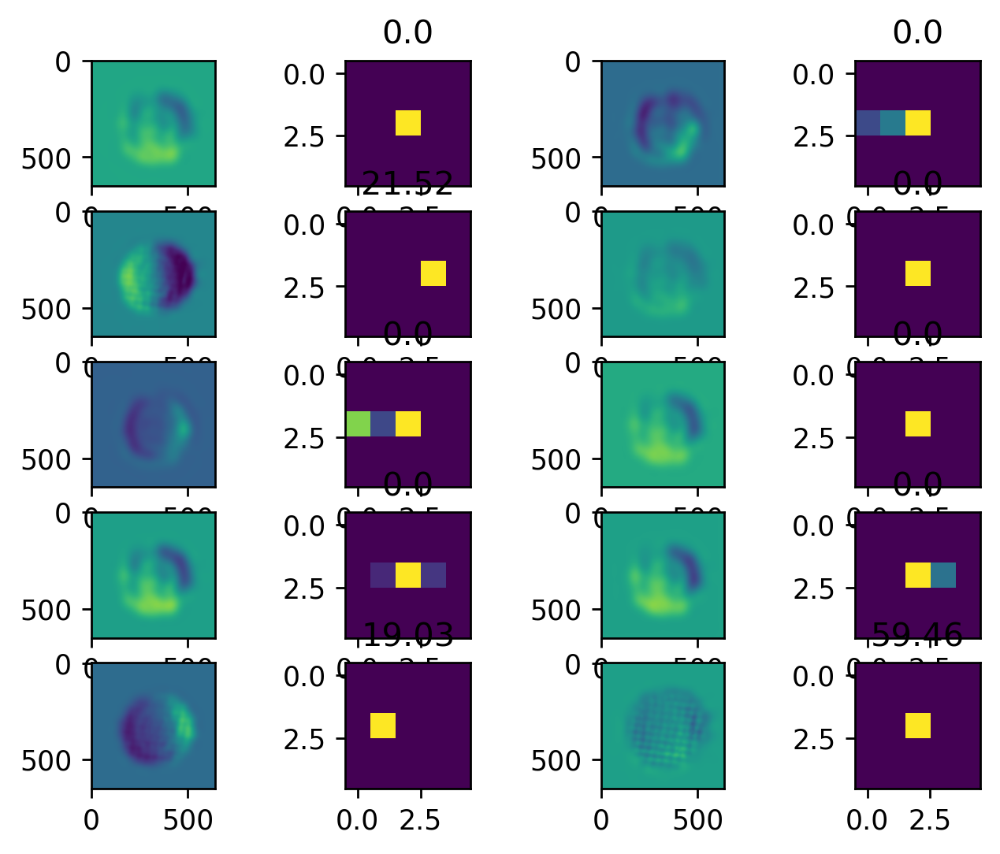

In [ ]:
conv = [p for p in CG_conv3dminus1.conv.parameters()][0]
maps,coeffs = [p for p in CG_conv3dminus1.CG.parameters()][:2]
conv = [p for p in CG_conv3dplus1.conv.parameters()][0]
maps,coeffs = [p for p in CG_conv3dplus1.CG.parameters()][:2]
# conv = [p for p in CG_conv3funda.conv.parameters()][0]
# maps,coeffs = [p for p in CG_conv3funda.CG.parameters()][:2]

scaled_coeffs = coeffs[0,:,0,0] * conv.mean((1,2,3))

scaled_coeffs = scaled_coeffs / scaled_coeffs.sum()

fig,ax = plt.subplots(5,4,dpi=250)

for i in range(5):
    ax[i,0].imshow(maps.cpu().detach()[0,i*2])
    ax[i,1].imshow(conv.cpu().detach()[i*2,0]); ax[i,1].set_title(np.round(scaled_coeffs[i*2].detach().cpu().numpy()*100,2))
    ax[i,2].imshow(maps.cpu().detach()[0,i*2+1])
    ax[i,3].imshow(conv.cpu().detach()[i*2+1,0]); ax[i,3].set_title(np.round(scaled_coeffs[i*2+1].detach().cpu().numpy()*100,2))

## What about on the mask?

In [ ]:
trained_kernel = torch.load('../kernel_mask.pt',map_location=device).requires_grad_(False)

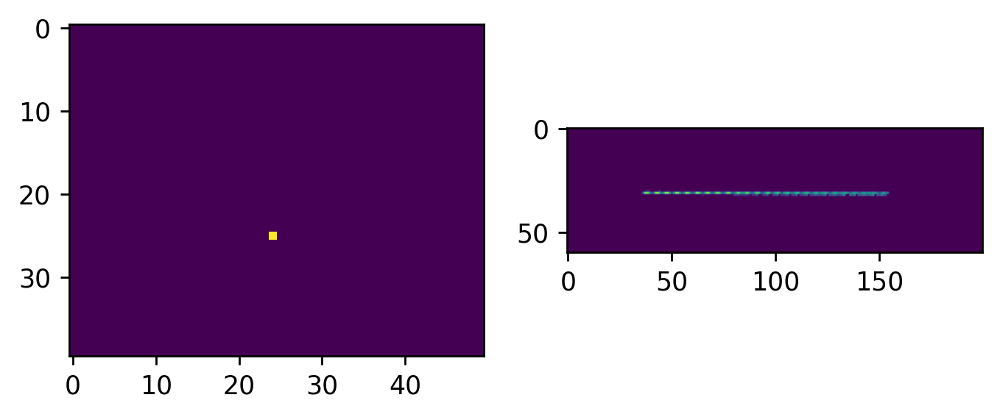

In [ ]:
fig,ax = plt.subplots(1,2,dpi=250)
ax[0].imshow(trained_kernel.sum((0,1))[300:340,1200:1250].cpu().detach())
ax[1].imshow(trained_kernel.sum((0,1))[290:350,200:400].cpu().detach())

# first make a cg conv layer with approx the right params. 

This is to remove field curvature

In [ ]:
loss_fn = torch.nn.MSELoss()

init_guess_pinhole = fwd.disperser.disperse_all_orders(mask_nograting_cube,trained_kernel).detach()
loss_fn(init_guess_pinhole,mask_grating_cube)

tensor(6.9670e-07, device='cuda:0')

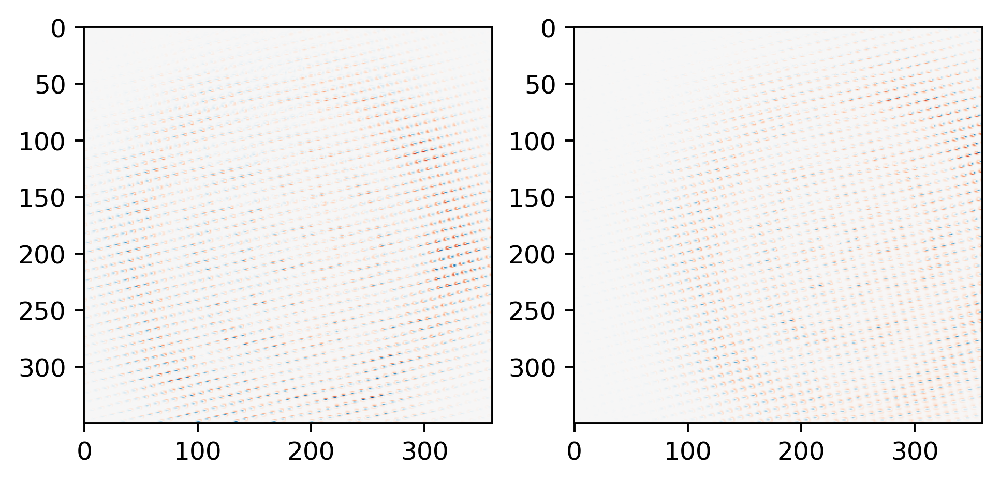

In [ ]:
wl = 11

from scipy.ndimage import gaussian_filter

blurred_truth = mask_grating_cube[:,wl].clone()
blurred_truth[0] = torch.ones_like(torch.tensor(gaussian_filter(blurred_truth[0].cpu().detach().numpy(),sigma=20)).to(device))

plot_orig = ((mask_grating_cube[0,wl,] - init_guess_pinhole[0,wl])/blurred_truth[0])[150:500,1980:2340]

vmax = plot_orig.abs().max()

fig,ax = plt.subplots(1,2,dpi=350)
a = ax[0].imshow(plot_orig.cpu().detach().numpy(),cmap = 'RdBu',vmax = vmax, vmin = -vmax)

wl = 24
blurred_truth = mask_grating_cube[:,wl].clone()
blurred_truth[0] = torch.ones_like(torch.tensor(gaussian_filter(blurred_truth[0].cpu().detach().numpy(),sigma=20)).to(device))
# plt.colorbar(a)
plot_final = ((mask_grating_cube[0,wl,] - init_guess_pinhole[0,wl])/blurred_truth[0])[150:500,1980:2340]
vmax = plot_final.abs().max()

b = ax[1].imshow(plot_final.cpu().detach().numpy(),cmap = 'RdBu',vmax = vmax, vmin = -vmax)

In [ ]:
del blurred_truth

In [ ]:
# truth = mask_grating_cube[...,:,100:500,1980:2340]
# init_guess_pinhole = init_guess_pinhole[...,:,100:500,1980:2340]

wl=11

truth = mask_grating_cube[:,wl:wl+1]
init_guess_pinhole_slice = init_guess_pinhole[:,wl:wl+1]

loss_fn(init_guess_pinhole_slice,truth)


tensor(1.0897e-06, device='cuda:0')

In [ ]:
kernelsize=5
# CG_conv_list = torch.nn.ModuleList([CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=50,kernelsize=kernelsize,init_size = truth.shape[2:],encoding_layers=20).to(device) for i in range(mask_grating_cube.shape[1])])
# CG_conv = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=50,kernelsize=kernelsize,init_size = truth.shape[2:],encoding_layers=20,locally_connected=False).to(device) 

CG_channels = 10

initialiser = torch.ones((1,CG_channels,mask_grating_cube.shape[2],mask_grating_cube.shape[3]))
initialiser = initialiser / CG_channels

# CG_conv_list = torch.nn.ModuleList([CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = truth.shape[2:],CG_type='map',initialiser = initialiser, regulariser=None).to(device) for i in range(mask_grating_cube.shape[1])])
# CG_conv = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = truth.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False).to(device) 

# CG_conv_list = torch.nn.ModuleList([CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = truth.shape[2:],CG_type='map',initialiser = initialiser, regulariser=None, locally_connected=False).to(device) for i in range(mask_grating_cube.shape[1])])
CG_conv = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = truth.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False).to(device) 
CG_conv3d = CG_convolution_layer(n_channels_in=1,n_channels_out=1,n_channels_CG=CG_channels,kernelsize=kernelsize,init_size = truth.shape[2:],CG_type='map',initialiser = initialiser, locally_connected=False, three_d=True,channels=mask_grating_cube.shape[1]).to(device) 
# same = torch.zeros((1,kernelsize,kernelsize))
# same[:,kernelsize//2,kernelsize//2] = 1

# with torch.no_grad():
#     CG_conv.conv.weight[0] = nn.Parameter(same)


# init_guess = CG_conv(init_guess_pinhole_slice)

# reg = hessian(torch.nn.functional.relu(CG_conv.CG.map))
#
loss_fn = torch.nn.MSELoss()

# loss = loss_fn(init_guess,truth)
# print(loss)

In [ ]:
init_reg_factor =1e-6# float(loss/reg) if reg!=0 else 1e-4

In [ ]:
float(init_reg_factor)

1e-06

In [ ]:
lr = 5e-3
epochs = 10000

optimizer = torch.optim.Adam(CG_conv.parameters(), lr=lr)

history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []

start_time_sec = time.time()


for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    CG_conv.train()
    num_train_examples = 1

    optimizer.zero_grad()
    
    yhat = torch.concat([CG_conv(init_guess_pinhole_slice[:,i:i+1]) for i in range(init_guess_pinhole_slice.shape[1])],dim=1)
    # yhat = CG_conv(init_guess_pinhole_slice)
    # reg = first_deriv(torch.nn.functional.relu(CG_conv.CG.map))#hessian(torch.nn.functional.relu(CG_conv.CG.map), boundaries = [800,1700])
    reg = hessian(torch.nn.functional.relu(CG_conv.CG.map), boundaries = [800,1700])
    mse = loss_fn(yhat,truth)
    loss = mse + reg * init_reg_factor

    loss.backward()
    optimizer.step()

    with torch.no_grad():
        for n,parameter in enumerate(CG_conv.parameters()):
            parameter.clamp_(min=0)

    # CG_conv.conv.weight.data = torch.clamp(CG_conv.conv.weight.data,0,100)

    train_loss         = loss.data.item() * mask_grating_cube.size(0)
    


    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g},train mse: {mse:5.5g}, train reg: {reg*init_reg_factor:5.5g}  epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)

KeyboardInterrupt: 

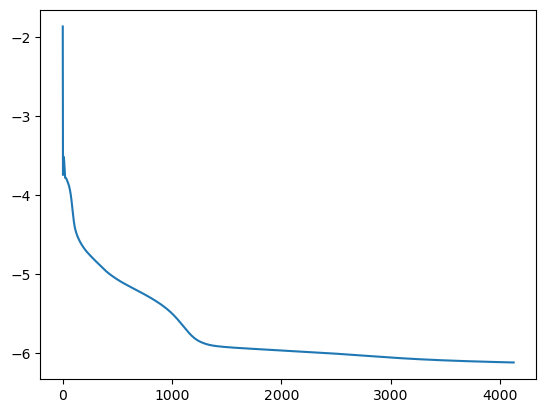

In [ ]:

plt.plot(np.log10(history2['mse']))

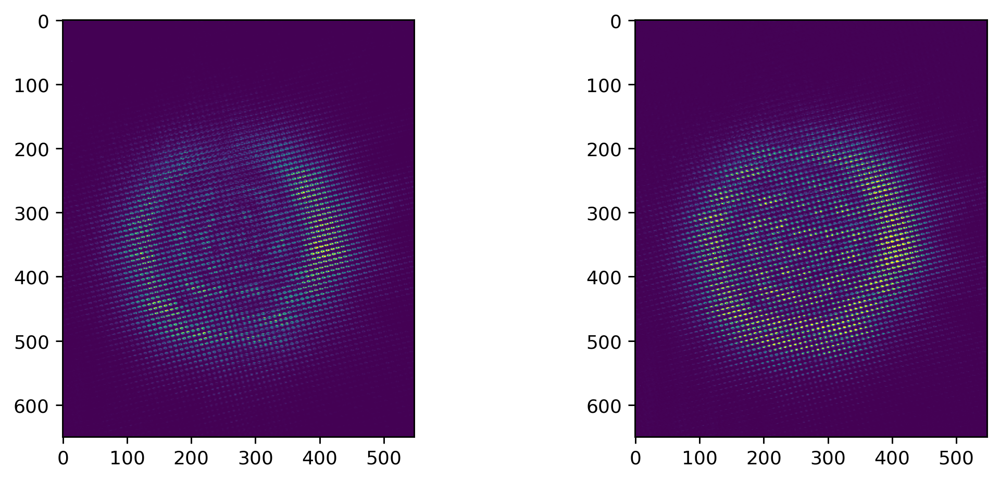

In [ ]:
init_guess = fwd.disperser.disperse_all_orders(mask_nograting_cube,kernel)

fig,ax = plt.subplots(1,2,figsize=(10,4),dpi=260)


ax[0].imshow((yhat[0,0] - mask_grating_cube[0,wl]).abs().cpu().detach().numpy()[...,1900:],vmax=0.01)
ax[1].imshow((init_guess[0,11] - mask_grating_cube[0,wl]).abs().cpu().detach().numpy()[...,1900:],vmax=0.01)

tensor(0.0022, device='cuda:0') tensor(0.0021, device='cuda:0') tensor(0.0022, device='cuda:0', grad_fn=<MeanBackward0>)


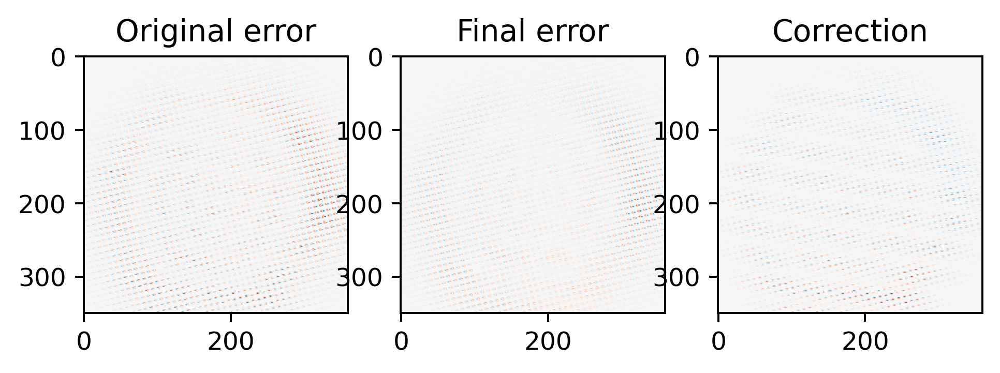

In [ ]:
wl = 11

blurred_truth = mask_grating_cube[:,wl].clone()
from scipy.ndimage import gaussian_filter

blurred_truth[0] = torch.ones_like(torch.tensor(gaussian_filter(blurred_truth[0].cpu().detach().numpy(),sigma=20)).to(device))

plot_orig = ((mask_grating_cube[0,wl,] - init_guess_pinhole_slice[0,0])/blurred_truth[0,wl])[150:500,1980:2340]

vmax = plot_orig.abs().max()

fig,ax = plt.subplots(1,3,dpi=350)
a = ax[0].imshow(plot_orig.cpu().detach().numpy(),cmap = 'RdBu',vmax = vmax, vmin = -vmax); ax[0].set_title('Original error')
# plt.colorbar(a)
plot_final = ((mask_grating_cube[0,wl,] - yhat[0,0,])/blurred_truth[0,wl])[150:500,1980:2340] #- plot_orig
# vmax = plot_final.abs().max()

b = ax[1].imshow(plot_final.cpu().detach().numpy(),cmap = 'RdBu',vmax = vmax, vmin = -vmax); ax[1].set_title('Final error')

plot_diff = (init_guess_pinhole_slice[0,0,150:500,1980:2340] - yhat[0,0,150:500,1980:2340])
vmax = plot_diff.abs().max()
b = ax[2].imshow(plot_diff.cpu().detach().numpy(),cmap = 'RdBu',vmax=vmax,vmin=-vmax);ax[2].set_title('Correction')
# plt.colorbar(b)


print(mask_grating_cube[:,wl].mean(), init_guess_pinhole_slice[:,0].mean(), yhat[:,0].mean())

NameError: name 'CG_conv' is not defined

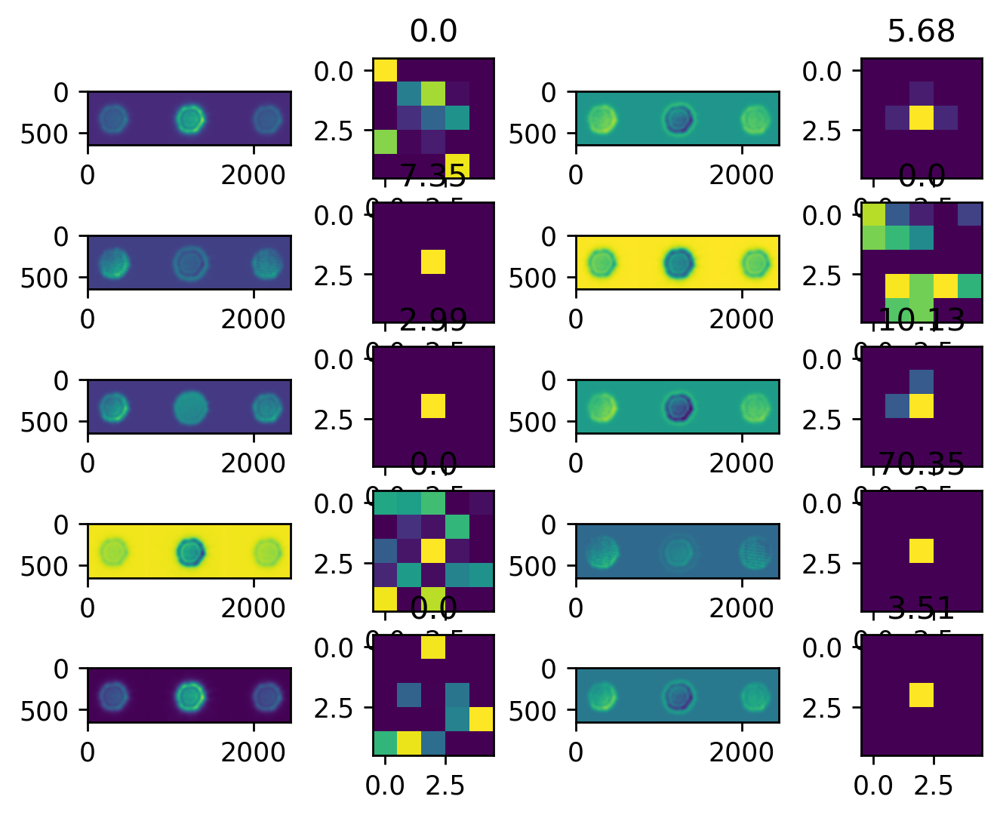

In [ ]:
conv = [p for p in CG_conv.conv.parameters()][0]
maps,coeffs = [p for p in CG_conv.CG.parameters()][:2]

# conv = [p for p in CG_conv3dfunda.conv.parameters()][0]
# maps,coeffs = [p for p in CG_conv3dfunda.CG.parameters()][:2]

scaled_coeffs = coeffs[0,:,0,0] * conv.mean((1,2,3)) * maps.mean((0,2,3))

scaled_coeffs = scaled_coeffs / scaled_coeffs.sum()

fig,ax = plt.subplots(5,4,dpi=250)

for i in range(5):
    ax[i,0].imshow(maps.cpu().detach()[0,i*2])
    ax[i,1].imshow(conv.cpu().detach()[i*2,0]); ax[i,1].set_title(np.round(scaled_coeffs[i*2].detach().cpu().numpy()*100,2))
    ax[i,2].imshow(maps.cpu().detach()[0,i*2+1])
    ax[i,3].imshow(conv.cpu().detach()[i*2+1,0]); ax[i,3].set_title(np.round(scaled_coeffs[i*2+1].detach().cpu().numpy()*100,2))

In [ ]:
CG_conv3d.conv.load_state_dict(CG_conv.conv.state_dict())

CG_conv3d.CG[11].load_state_dict(CG_conv.CG.state_dict()) 
CG_conv3d.CG[12].load_state_dict(CG_conv.CG.state_dict()) 
CG_conv3d.CG[13].load_state_dict(CG_conv.CG.state_dict()) 

<All keys matched successfully>

In [ ]:
# init_reg_factor = 5e-

In [ ]:
lr = 5e-3
# init_reg_factor = 1e-7

epochs = 3000

optimizer = torch.optim.Adam(CG_conv3d.parameters(), lr=lr)
# optimizer = torch.optim.Adam(CG_conv.parameters(), lr=lr)

history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []

start_time_sec = time.time()

for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    CG_conv3d.train()
    # CG_conv.train()
    num_train_examples = 1

    optimizer.zero_grad()
    
    yhat = CG_conv3d(init_guess_pinhole)
    all_reg = []
    for i in range(mask_grating_cube.shape[1]):
        all_reg.append(hessian(torch.nn.functional.relu(CG_conv3d.CG[i].map), boundaries = [800,1700]))
    reg = torch.mean(torch.stack(all_reg))

    spectral_reg = torch.gradient(torch.concat([torch.nn.functional.relu(CG_conv3d.CG[i].map) for i in range(mask_grating_cube.shape[1])]), dim=0)[0]
    spectral_reg = torch.norm(torch.gradient(spectral_reg,dim=0)[0],2)

    reg += spectral_reg


    mse = loss_fn(yhat,mask_grating_cube) 
    
    loss = mse + reg * init_reg_factor

    loss.backward()
    optimizer.step()

    for i in range(mask_grating_cube.shape[1]):
        CG_conv3d.conv.weight.data = torch.clamp(CG_conv3d.conv.weight.data,0,100)
    # CG_conv.conv.weight.data = torch.clamp(CG_conv.conv.weight.data,0,100)


    train_loss         = loss.data.item() * mask_grating_cube.size(0)
    


    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g},train mse: {mse:5.5g},train reg: {reg*init_reg_factor:5.5g},  epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)

KeyboardInterrupt: 

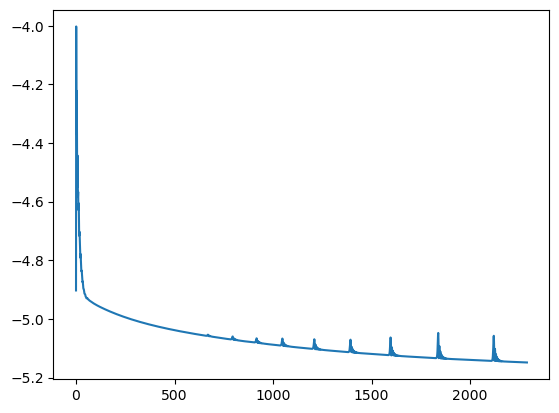

In [ ]:
plt.plot(np.log10(history2['mse'])[:])

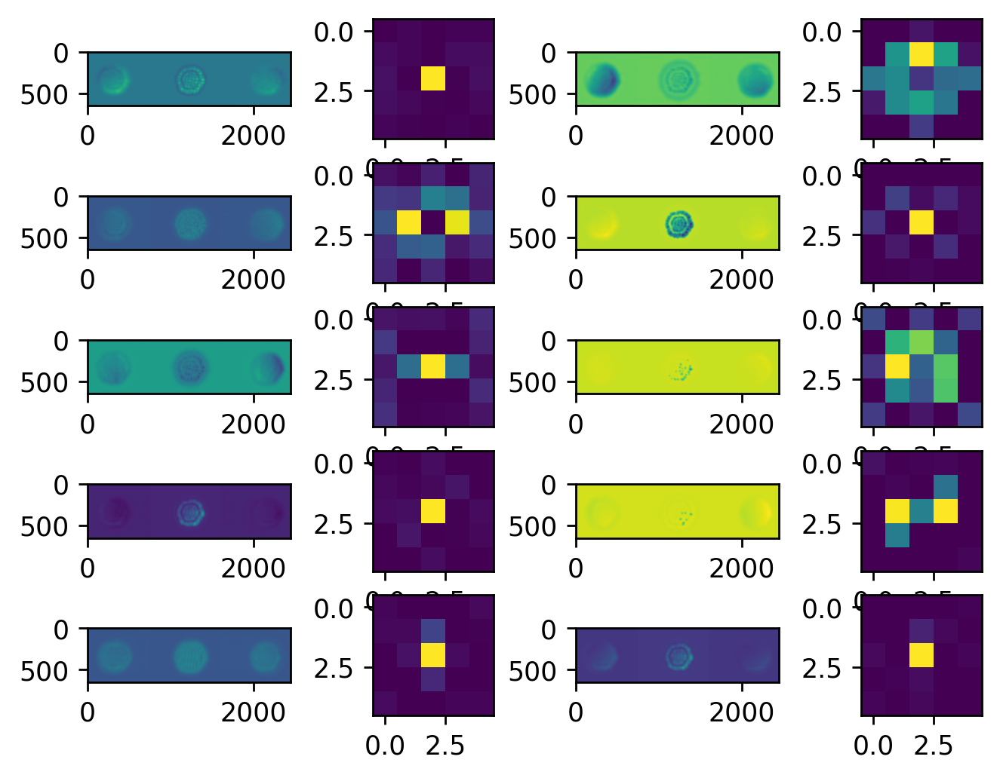

In [ ]:
conv = [p for p in CG_conv3d.conv.parameters()][0]
maps = [p for p in CG_conv3d.CG[12].parameters()][0]

fig,ax = plt.subplots(5,4,dpi=250)

for i in range(5):
    ax[i,0].imshow(maps.cpu().detach()[0,i*2])
    ax[i,1].imshow(conv.cpu().detach()[i*2,0])
    ax[i,2].imshow(maps.cpu().detach()[0,i*2+1])
    ax[i,3].imshow(conv.cpu().detach()[i*2+1,0])

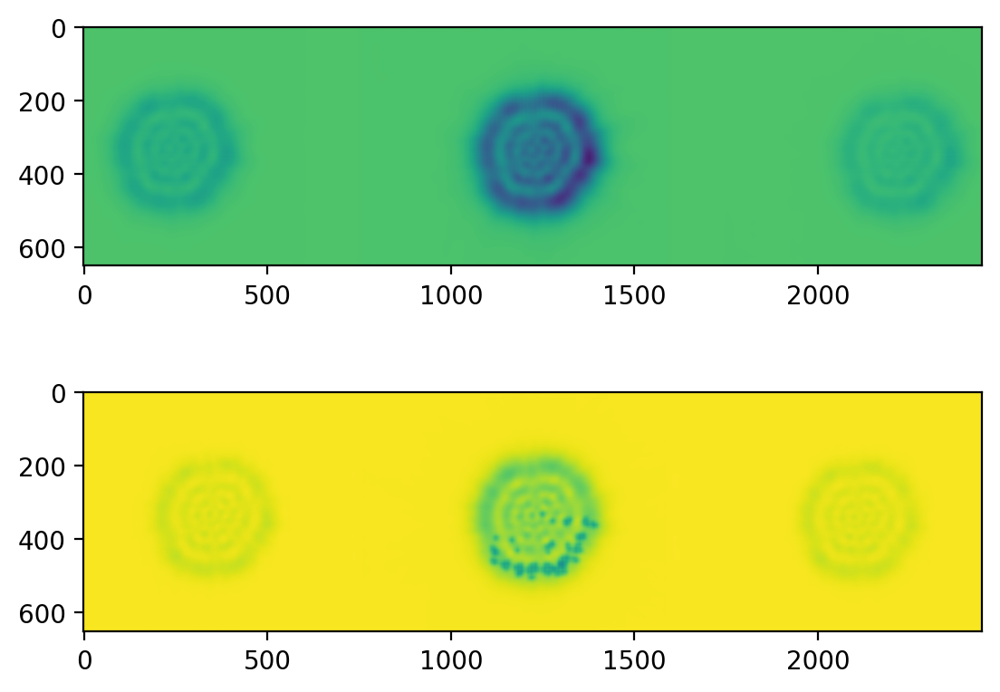

In [ ]:
fig,ax = plt.subplots(2,1,dpi=200)
maps = [p for p in CG_conv3d.CG[-1].parameters()][0]
ax[0].imshow(maps[0,0].cpu().detach())
maps = [p for p in CG_conv3d.CG[1].parameters()][0]
ax[1].imshow(maps[0,0].cpu().detach())


In [ ]:
yhat = torch.concat([CG_conv_list[i](init_guess_pinhole[:,i:i+1]) for i in range(mask_grating_cube.shape[1])],dim=1)

reg = torch.mean(torch.stack([hessian(torch.nn.functional.relu(CG_conv_list[i].CG.map)) for i in range(mask_grating_cube.shape[1])]))

loss = loss_fn(yhat,mask_grating_cube)

In [ ]:
init_reg_factor=5e-7

In [ ]:
padding = 1


fine_model_mask = KernelLearner(kernel=trained_kernel.detach().clone(), padding=padding).to(device) 

lr = 1e-3
epochs = 1300

all_params = list(fine_model_mask.parameters()) + list(CG_conv.parameters())

optimizer = torch.optim.Adam(all_params, lr=lr)

init_guess = fine_model_mask(mask_nograting_cube)
#
loss_fn = torch.nn.MSELoss()

loss = loss_fn(init_guess,mask_grating_cube)
print(loss)

tensor(8.2774e-06, device='cuda:1', grad_fn=<MseLossBackward0>)


In [ ]:
history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []

start_time_sec = time.time()

for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    fine_model_mask.train()
    num_train_examples = 1

    optimizer.zero_grad()
    
    yhat = fine_model_mask(mask_nograting_cube)
    yhat = torch.concat([CG_conv(yhat[:,i:i+1]) for i in range(mask_grating_cube.shape[1])],dim=1)
    loss = loss_fn(yhat, mask_grating_cube)

    loss.backward()
    optimizer.step()

    train_loss         = loss.data.item() * mask_grating_cube.size(0)
    


    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g}, epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)

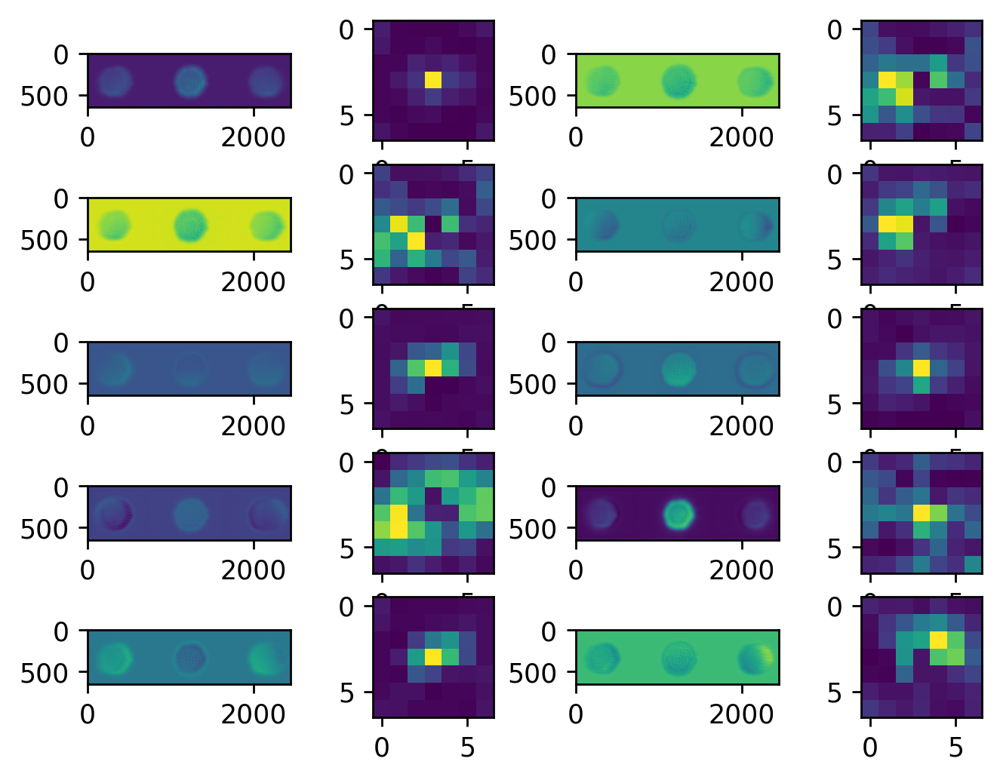

In [ ]:
bla = [p for p in CG_conv.parameters()]

fig,ax = plt.subplots(5,4,dpi=250)

for i in range(5):
    ax[i,0].imshow(bla[2].cpu().detach()[0,i*2])
    ax[i,1].imshow(bla[0].cpu().detach()[i*2,0])
    ax[i,2].imshow(bla[2].cpu().detach()[0,i*2+1])
    ax[i,3].imshow(bla[0].cpu().detach()[i*2+1,0])

Text(0.5, 0, 'Epochs')

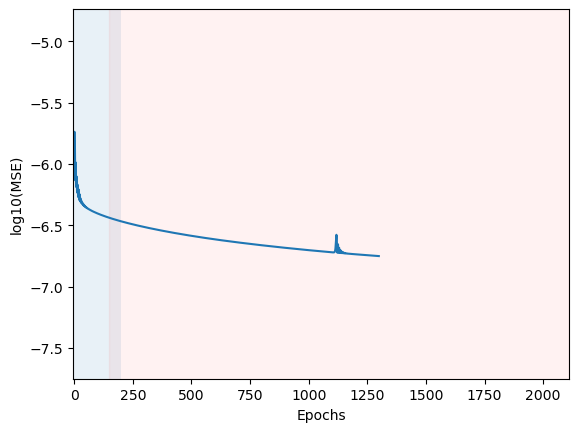

In [ ]:
mina, maxa = np.log10(history2['mse']).min(), np.log10(history2['mse']).max()

plt.plot(np.log10(history2['mse']))
# plt.plot(np.log10(history['mse']+history2['mse']))
plt.fill_betweenx(np.linspace(-9,1,100),-1,200,alpha=0.1)
plt.fill_betweenx(np.linspace(-9,1,100),150,2109,color='r',alpha=0.05)

plt.xlim([-5,2110])
plt.ylim([mina-1,maxa+1])
plt.ylabel('log10(MSE)')
plt.xlabel('Epochs')

In [ ]:
trained_kernel = fine_model_mask.fill_kernel()
torch.save(trained_kernel, '../kernel_mono_mask.pt')

In [ ]:
print(loss_fn(fine_model_mask(nograting_cube), grating_cube))
print(loss_fn(fine_model_mask(mask_nograting_cube), mask_grating_cube))
print(loss_fn(fine_model_mask(lines_nograting_cube), lines_grating_cube))

tensor(1.6460e-09, device='cuda:1', grad_fn=<MseLossBackward0>)
tensor(1.8693e-06, device='cuda:1', grad_fn=<MseLossBackward0>)
tensor(9.0560e-07, device='cuda:1', grad_fn=<MseLossBackward0>)


In [ ]:
trained_kernel = torch.load('../kernel_mono_mask.pt',map_location=device).requires_grad_(False)

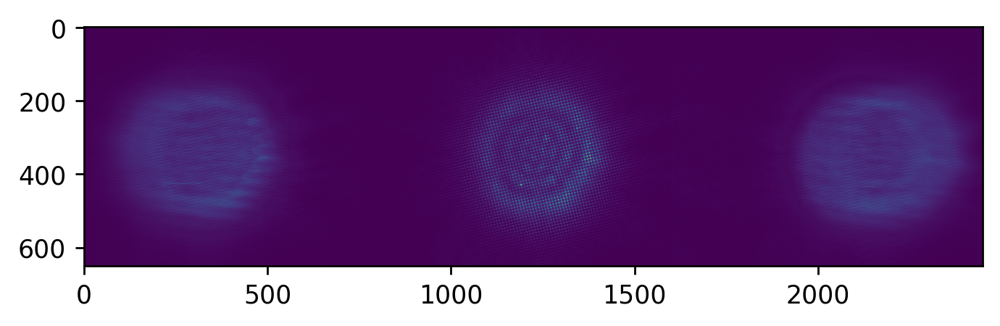

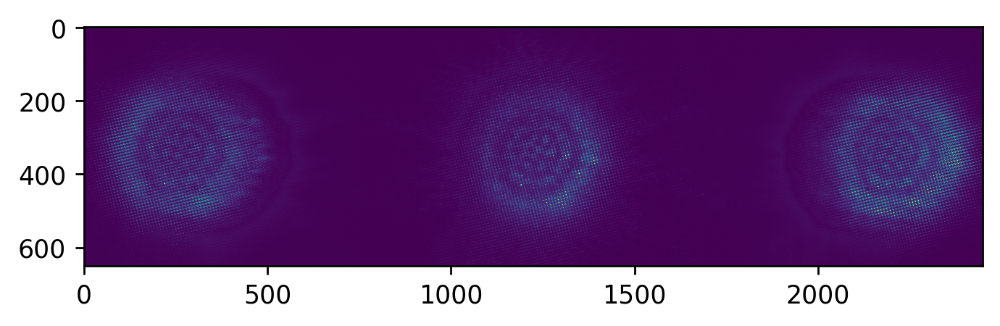

In [ ]:
plt.figure(dpi=250)
plt.imshow((mask_grating_cube[0,:,] - yhat[0,:,]).abs().sum(0).cpu().detach().numpy(),vmax = mask_grating_cube[0,:,].sum(0).max() * 0.01)

wl = 21

plt.figure(dpi=250)
plt.imshow((mask_grating_cube[0,wl,] - yhat[0,wl,]).abs().cpu().detach().numpy(),vmax= mask_grating_cube[0,wl,].max()*0.01)

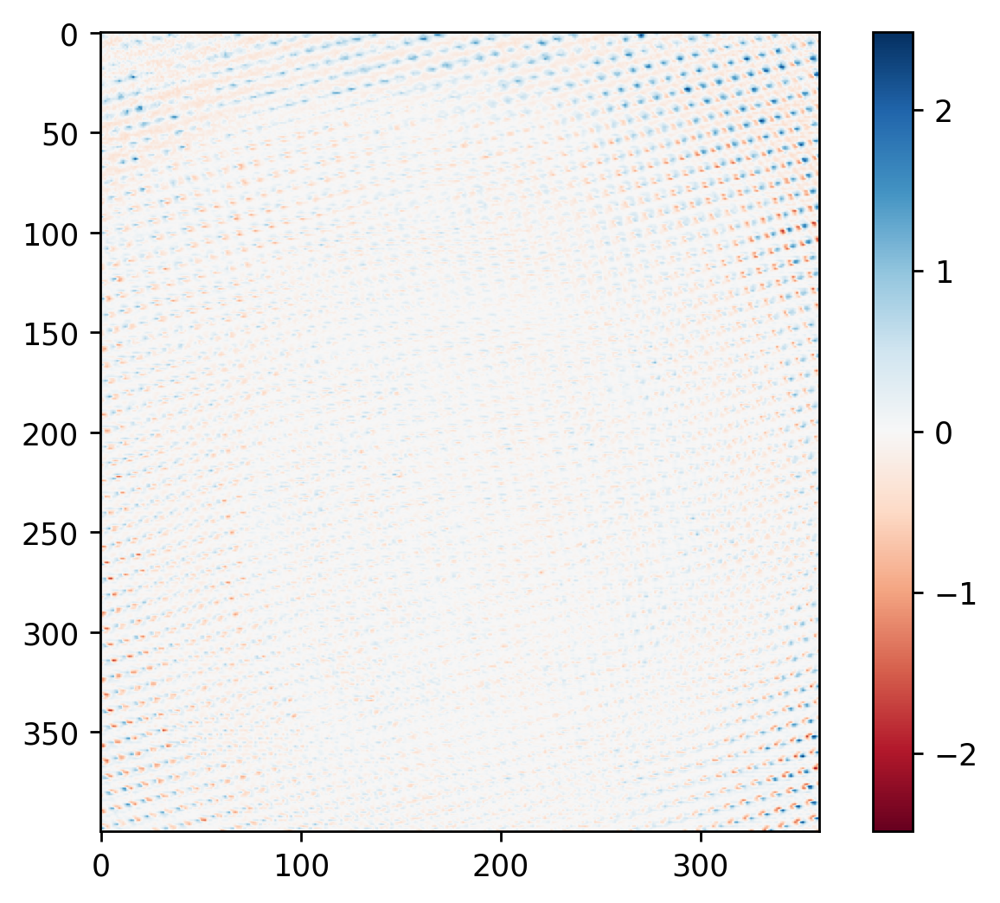

In [ ]:
wl = 11

blurred_truth = mask_grating_cube.clone()
from scipy.ndimage import gaussian_filter

blurred_truth[0,wl] = torch.tensor(gaussian_filter(blurred_truth[0,wl].cpu().detach().numpy(),sigma=20)).to(device)

plot = ((mask_grating_cube[0,wl,] - yhat[0,wl,])/blurred_truth[0,wl])[100:500,1980:2340]

vmax = plot.abs().max()

plt.figure(dpi=250)
plt.imshow(plot.cpu().detach().numpy(),cmap = 'RdBu',vmax = vmax, vmin = -vmax)
plt.colorbar()

In [ ]:
yhat_inv = fwd.disperser.undisperse_all_orders( mask_grating_cube,trained_kernel)

In [ ]:
loss_fn(yhat_inv,mask_nograting_cube) 

tensor(1.6145e-06, device='cuda:1', dtype=torch.float64,
       grad_fn=<MseLossBackward0>)

### train it on the inverses too

In [ ]:
kernel = torch.load('../kernel_mono_mask.pt',map_location=device).requires_grad_(False)

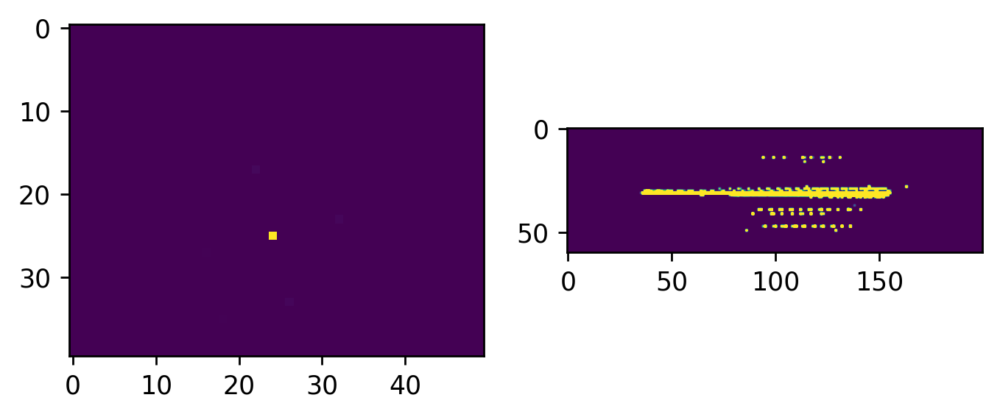

In [ ]:
fig,ax = plt.subplots(1,2,dpi=250)
ax[0].imshow(kernel.sum((0,1))[300:340,1200:1250].cpu().detach(),vmax=5)
ax[1].imshow(kernel.sum((0,1))[290:350,200:400].cpu().detach(),vmax=0.001)

In [ ]:
padding = 10


fine_model_all = KernelLearner(kernel=kernel.detach().clone(), padding=padding).to(device) 

lr = 4e-6
epochs = 1300

optimizer = torch.optim.Adam(fine_model_all.parameters(), lr=lr)

init_guess = fine_model_all(mask_nograting_cube)
#
loss_fn = torch.nn.MSELoss()

loss = loss_fn(init_guess,mask_grating_cube)
print(loss)

tensor(6.8879e-07, device='cuda:1', dtype=torch.float64,
       grad_fn=<MseLossBackward0>)


In [ ]:
history2 = {} # Collects per-epoch loss and acc like Keras' fit().
history2['mse'] = []
history2['forward'] = []
history2['inverse'] = []

start_time_sec = time.time()

for epoch in range(1, epochs+1):
    # --- TRAIN AND EVALUATE ON TRAINING SET -----------------------------
    start_time_sec = time.time()
    fine_model_all.train()
    num_train_examples = 1

    optimizer.zero_grad()
    
    yhat = fine_model_all(mask_nograting_cube)
    yhat_p = fine_model_all(nograting_cube)

    yhat_inv = fine_model_all.forward_inverse(mask_grating_cube)
    yhat_p_inv = fine_model_all.forward_inverse(grating_cube)

    loss_forward = loss_fn(yhat, mask_grating_cube)
    loss_inverse = loss_fn(yhat_inv, mask_nograting_cube)
    loss_forward_p = loss_fn(yhat_p, grating_cube)
    loss_inverse_p = loss_fn(yhat_p_inv, nograting_cube)

    loss = loss_forward + loss_inverse + loss_forward_p + loss_inverse_p

    loss.backward()
    optimizer.step()

    train_loss         = loss.data.item() * mask_grating_cube.size(0)
    


    end_time_sec       = time.time()
    total_time_sec     = end_time_sec - start_time_sec

    print(f'Epoch {epoch}/{epochs}:, train loss: {train_loss:5.5g}, lossforward: {loss_forward.data.item():5.5g}, lossinverse: {loss_inverse:5.5g},lossforwardp: {loss_forward_p.data.item():5.5g}, lossinversep: {loss_inverse_p:5.5g}, epoch time: {total_time_sec:5.5g}',end='\r')


    history2['mse'].append(train_loss)
    history2['forward'].append(loss_forward.data.item())
    history2['inverse'].append(loss_inverse.data.item())

KeyboardInterrupt: 

In [ ]:
fine_model_all.lamb

Parameter containing:
tensor([0.0002], device='cuda:1', requires_grad=True)

In [ ]:
trained_kernel = fine_model_all.fill_kernel()
torch.save(trained_kernel, '../kernel_mono_inv.pt')


In [ ]:
del kernel

In [ ]:
torch.cuda.empty_cache()

In [ ]:
mask_pred = fwd.disperser.undisperse_all_orders( mask_grating_cube,trained_kernel)

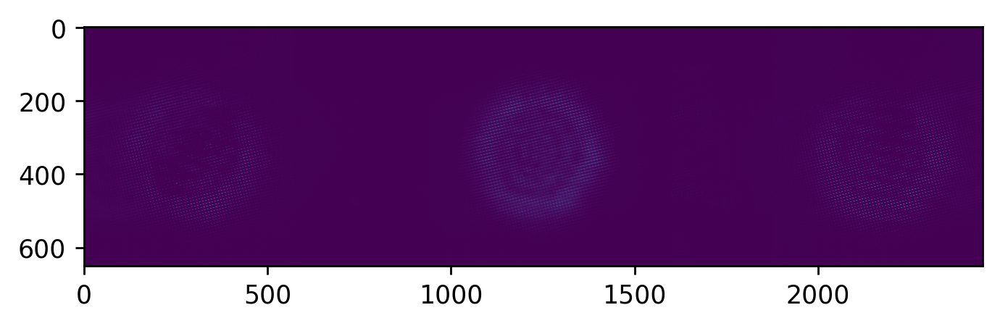

In [ ]:
fig,ax = plt.subplots(1,1,dpi=250)
ax.imshow((mask_pred[0,14].detach().cpu() - mask_nograting_cube[0,14].detach().cpu()).abs(), vmax = mask_nograting_cube[0,14].detach().cpu().max() * 0.05)

In [ ]:
lines_pred = fwd.disperser.undisperse_all_orders( lines_grating_cube,trained_kernel)
lines_grating_pred = fwd.disperser.disperse_all_orders( lines_nograting_cube,trained_kernel)

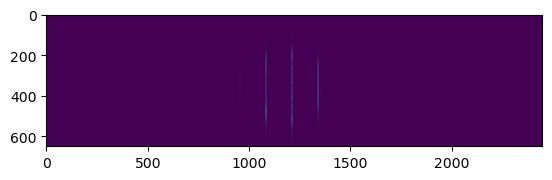

In [ ]:
plt.imshow(lines_pred.sum((0,1)).cpu().detach())

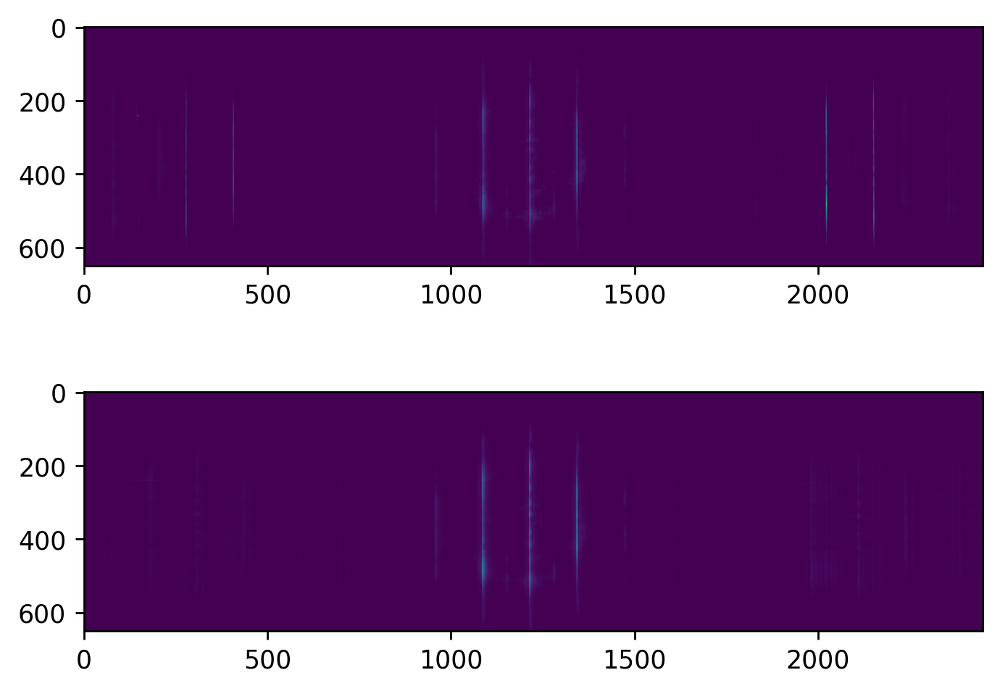

In [ ]:
fig,ax = plt.subplots(2,1,dpi=250)
ax[0].imshow((lines_pred[0,14].detach().cpu() - lines_nograting_cube[0,14].detach().cpu()).abs(), vmax = lines_nograting_cube[0,14].detach().cpu().max() * 0.1)
ax[1].imshow((lines_pred[0,:].detach().cpu() - lines_nograting_cube[0,:].detach().cpu()).abs().sum(0), vmax = lines_nograting_cube[0,:].sum(0).detach().cpu().max() * 0.1)

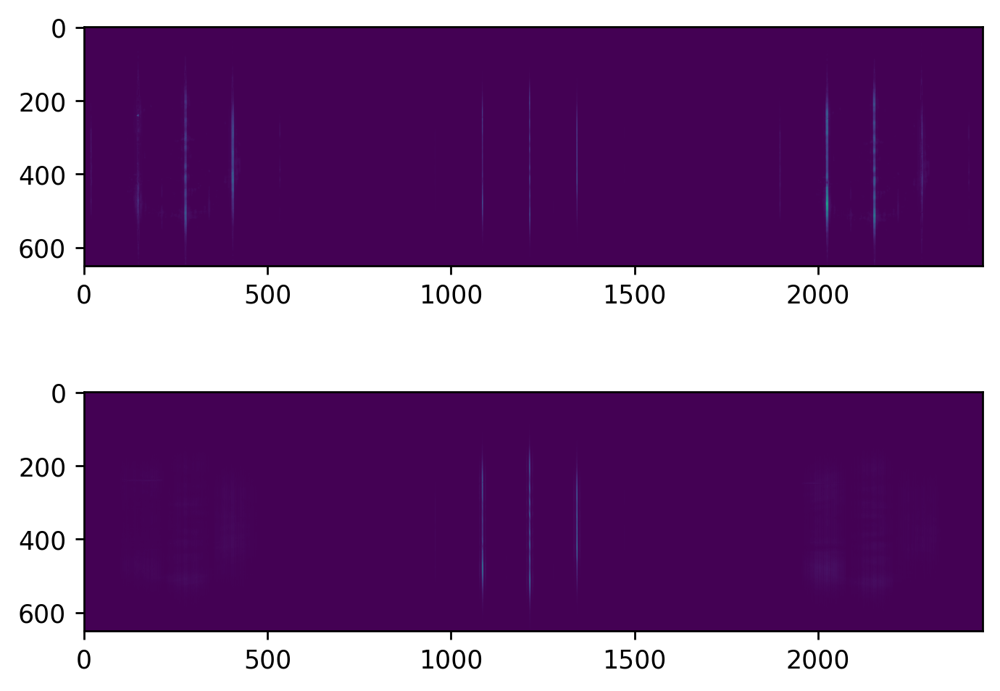

In [ ]:
fig,ax = plt.subplots(2,1,dpi=250)
ax[0].imshow((lines_grating_pred[0,14].detach().cpu() - lines_grating_cube[0,14].detach().cpu()).abs(), vmax = lines_grating_cube[0,14].detach().cpu().max() * 0.1)
ax[1].imshow((lines_grating_pred[0,:].detach().cpu() - lines_grating_cube[0,:].detach().cpu()).abs().sum(0), vmax = lines_grating_cube[0,:].sum(0).detach().cpu().max() * 0.1)

In [ ]:
trained_kernel = torch.load('../kernel_mono_all.pt',map_location=device).requires_grad_(False)

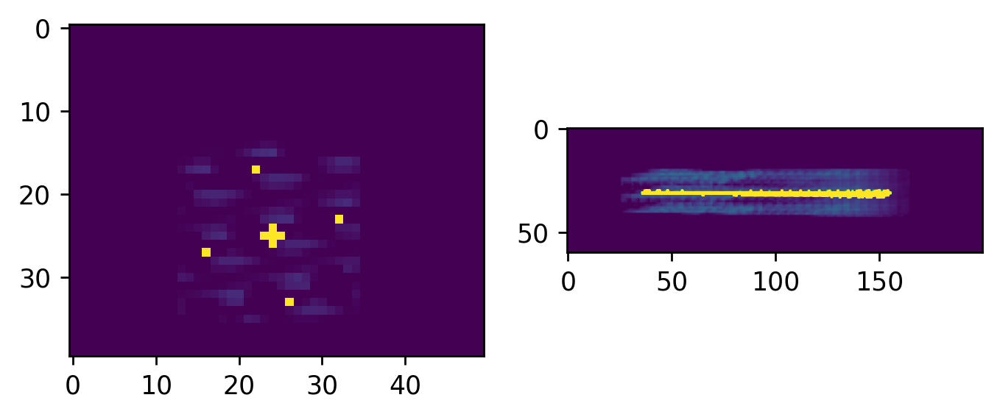

In [ ]:
fig,ax = plt.subplots(1,2,dpi=250)
ax[0].imshow(trained_kernel.sum((0,1))[300:340,1200:1250].cpu().detach(),vmax=0.01)
ax[1].imshow(trained_kernel.sum((0,1))[290:350,200:400].cpu().detach(),vmax=0.001)